In [26]:
# import modules
%matplotlib notebook

import numpy as np
import datetime
import pickle
import copy
from  multiprocessing import Pool

import matplotlib.pyplot as plt
import matplotlib
from cycler import cycler
_colc = cycler(color=[
    '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
    '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf',
    '#3f97d4', '#df5f0e', '#1c801c', '#ff0000', '#bbbb00',
    '#0000ff', '#00dd00', '#000000'])
matplotlib.rcParams['axes.prop_cycle'] = _colc #* cycler(ls=['-', '--'])
matplotlib.rcParams['font.size'] = 15
matplotlib.rcParams['xtick.direction'] = 'in'
matplotlib.rcParams['ytick.direction'] = 'in'

In [2]:
from sci2tex import sci2tex
import chempl
from chempl import (cs, run_one_model, get_total_charge,
                    N_H_to_Av, Av_to_N_H, N_H_to_ngas,
                    Td_from_Av, chem2tex, printFormationDestruction)
phy_params_default = chempl.get_phy_params_default()

# Test the handling of reactions with two temperature-range-of-applicability

In [3]:
model = chempl.ChemModel(fReactions=b'rate12_combined_no_surface_reaction.dat',
                         fInitialAbundances=b'initial_abundances.dat',
                         fSpeciesEnthalpies=b'Species_enthalpy.dat')
model.set_phy_params_by_dict(phy_params_default)
model.prepare().set_solver()

In [4]:
phy_params_default

{b'Av': 20.0,
 b'G0_UV': 1.0,
 b'Ncol_H2': 4e+22,
 b'T_dust': 15.0,
 b'T_gas': 15.0,
 b'chemdesorption_factor': 0.05,
 b'chi_Xray': 0.0,
 b'chi_cosmicray': 1.0,
 b'dust2gas_mass': 0.01,
 b'dust_albedo': 0.6,
 b'dust_material_density': 2.0,
 b'dust_radius': 1e-05,
 b'dust_site_density': 1000000000000000.0,
 b'dv_km_s': 1.0,
 b'v_km_s': 14.5,
 b'mean_mol_weight': 1.4,
 b'n_gas': 50000.0,
 b't_max_year': 10000000.0}

In [5]:
model.find_duplicate_reactions()
for r in model.duplicate_reactions:
    print(model.reactions[r])

{'reactants': [b'H-', b'H'], 'products': [b'H2', b'E-'], 'abc': [4.82e-09, 0.02, 4.3, 4.32e-09, -0.39, 39.4], 'Trange': [10.0, 100.0, 101.0, 3000.0], 'itype': 5, 'drdy': [nan, nan], 'rate': 0.0, 'heat': 0.0}
{'reactants': [b'S', b'C+'], 'products': [b'C', b'S+'], 'abc': [5e-11, 0.0, 0.0, 5.54e-12, 0.86, 680.7], 'Trange': [10.0, 4999.0, 5000.0, 50000.0], 'itype': 5, 'drdy': [nan, nan], 'rate': 0.0, 'heat': 0.0}
{'reactants': [b'C2H3+', b'E-'], 'products': [b'C2', b'H', b'H2'], 'abc': [1.5e-08, -0.84, 0.0, 2.87e-08, -1.38, 0.0], 'Trange': [50.0, 1000.0, 1000.0, 30000.0], 'itype': 5, 'drdy': [nan, nan], 'rate': 0.0, 'heat': 0.0}
{'reactants': [b'C2H3+', b'E-'], 'products': [b'C2H2', b'H'], 'abc': [1.45e-07, -0.84, 0.0, 2.78e-07, -1.38, 0.0], 'Trange': [50.0, 1000.0, 1000.0, 30000.0], 'itype': 5, 'drdy': [nan, nan], 'rate': 0.0, 'heat': 0.0}
{'reactants': [b'C2H3+', b'E-'], 'products': [b'C2H', b'H2'], 'abc': [3e-08, -0.84, 0.0, 5.75e-08, -1.38, 0.0], 'Trange': [50.0, 1000.0, 1000.0, 30000

In [6]:
def check_discontinuity(svr, idup, ax, width=None):
    svr.find_duplicate_reactions()
    y = [1.0] * len(svr.name2idx)
    arrhenius = chempl.rate_Arrhenius
    all_reactions = svr.reactions # Make a cache
    for dp in svr.duplicate_reactions[idup:idup+1]:
        T_break0 = all_reactions[dp]['Trange'][1]
        T_s = np.linspace(T_break0 * 0.86, T_break0*1.14, num=100)
        rate_C_code = []
        for T in T_s:
            # Set y and n_gas to 1.0 to get the rate coefficient
            # That is: dnx/dt = -k * nx * ny, and we want the k.
            svr.set_phy_params_by_dict({b'T_gas': T, b'n_gas': 1.0})
            rate_C_code.append(svr.calculate_a_rate(0.0, y, dp))

        nIntervals = len(all_reactions[dp]['Trange'])//2
        for i in range(nIntervals):
            rates = []
            for T in T_s:
                rates.append(arrhenius(T, all_reactions[dp]['abc'], i*3))
            rates = np.array(rates)
            idx_in = np.logical_and(T_s >= all_reactions[dp]['Trange'][i*2],
                                    T_s <= all_reactions[dp]['Trange'][i*2+1])
            idx_out = np.logical_or(T_s < all_reactions[dp]['Trange'][i*2],
                                    T_s > all_reactions[dp]['Trange'][i*2+1])
            a,b,c = all_reactions[dp]['abc'][i*3:i*3+3]
            sabc = ('$' + sci2tex('{:.3g}'.format(a)) +
                    ((r'\left(\frac{{T}}{{300}}\right)^{' + '{:.2f}'.format(b) + '}') if b != 0 else '') +
                    (('e^{'+'{:.1f}'.format(-c)+'/T}') if c != 0 else '') + '$')
            sTrange = '({:.0f},{:.0f}): '.format(all_reactions[dp]['Trange'][i*2],
                                                 all_reactions[dp]['Trange'][i*2+1])
            L = ax.plot(T_s[idx_in], rates[idx_in], label=sTrange + sabc, lw=5)
            ax.plot(T_s[idx_out], rates[idx_out], lw=5, ls='--', color=L[0].get_color())
            if i*2+2 < len(all_reactions[dp]['Trange']):
                T_b = all_reactions[dp]['Trange'][i*2+1:i*2+3]
                v_b = [chempl.rate_Arrhenius(T_b[0], all_reactions[dp]['abc'], i*3),
                       chempl.rate_Arrhenius(T_b[1], all_reactions[dp]['abc'], i*3+3)]
                ax.plot(T_b, v_b, color=(0.4,0.4,0.4), ls=':', lw=2, zorder=10,
                        marker='o', markerfacecolor='none', markeredgewidth=2, markersize=8)
        ax.plot(T_s, rate_C_code, color=(1,0.8,0.8), lw=2.7, zorder=20)
        ax.plot(T_s, rate_C_code, color=(1,0,0), lw=2, label='Joined', zorder=20)
    return

## Figures for the paper

<IPython.core.display.Javascript object>


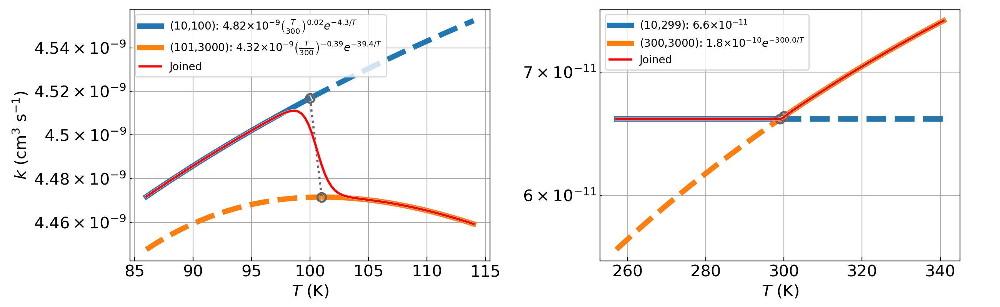

In [7]:
fig = plt.figure(figsize=(13,4))
ax_s = [fig.add_axes([0.13,0.15,0.36,0.82]),
        fig.add_axes([0.6,0.15,0.36,0.82])]
for ax in ax_s:
    ax.grid(axis='both', which='both')
    ax.set_xlabel('$T$ (K)')
    ax.set_yscale('log')
ax_s[0].set_ylabel('$k$ (cm$^{3}$ s$^{-1}$)')

ax = ax_s[0]
check_discontinuity(model, 0, ax, width=None)
ax.legend(fontsize=10)
ax = ax_s[1]
check_discontinuity(model, 18, ax, width=None)
ax.legend(fontsize=10)
#plt.savefig('smoothRATE12.pdf', bbox_inches='tight')

## Figures for all those reactions with two temperature ranges

<IPython.core.display.Javascript object>


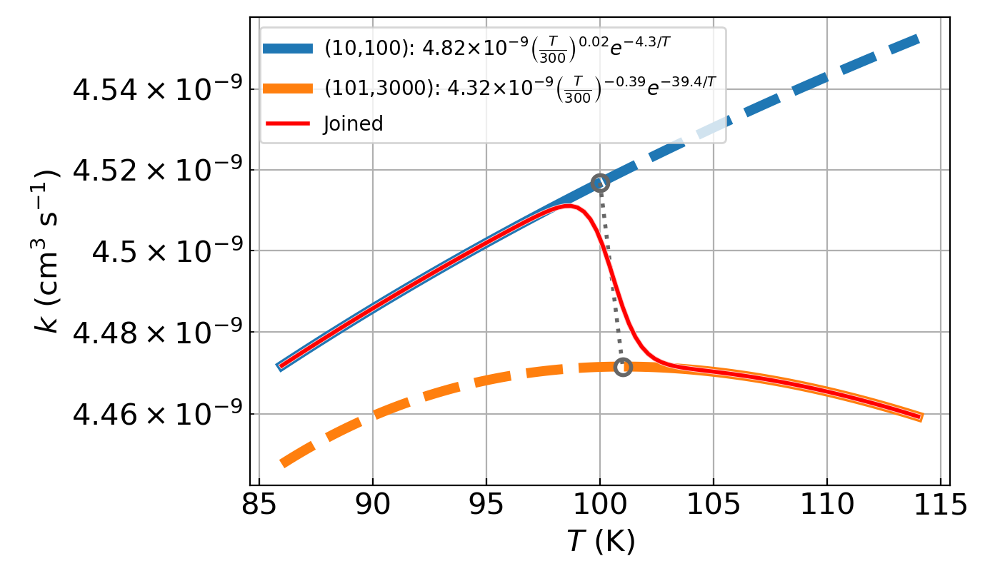

<IPython.core.display.Javascript object>


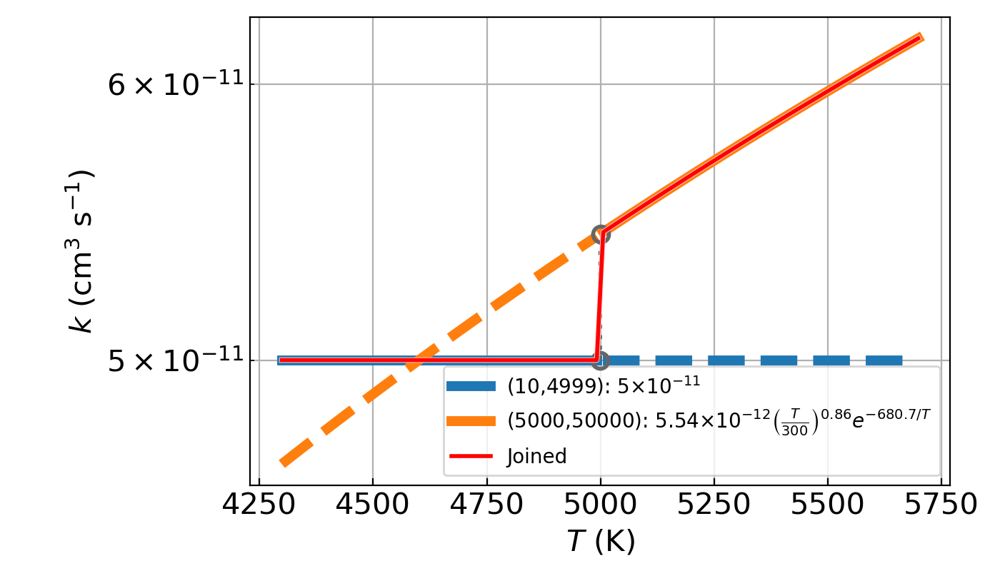

<IPython.core.display.Javascript object>


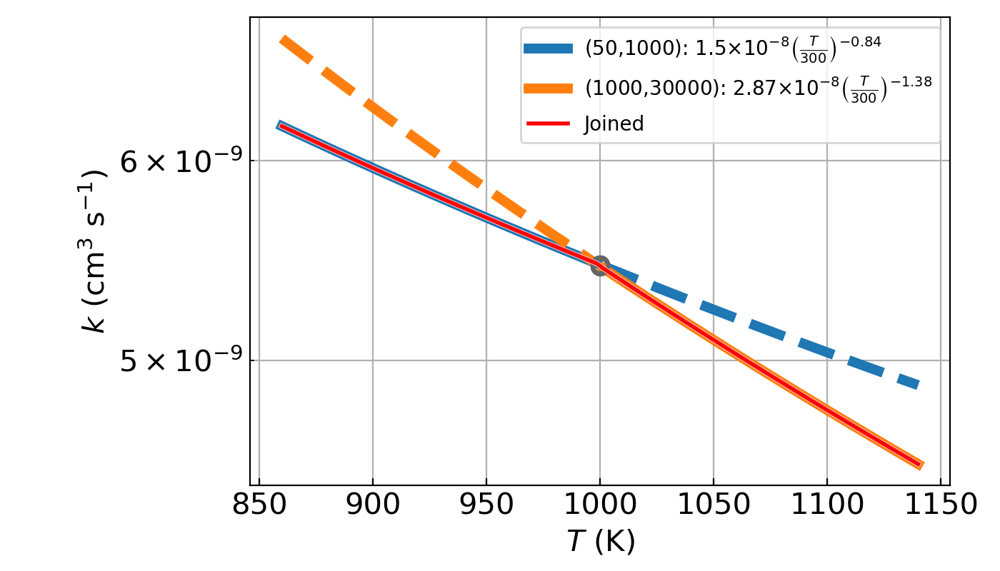

<IPython.core.display.Javascript object>


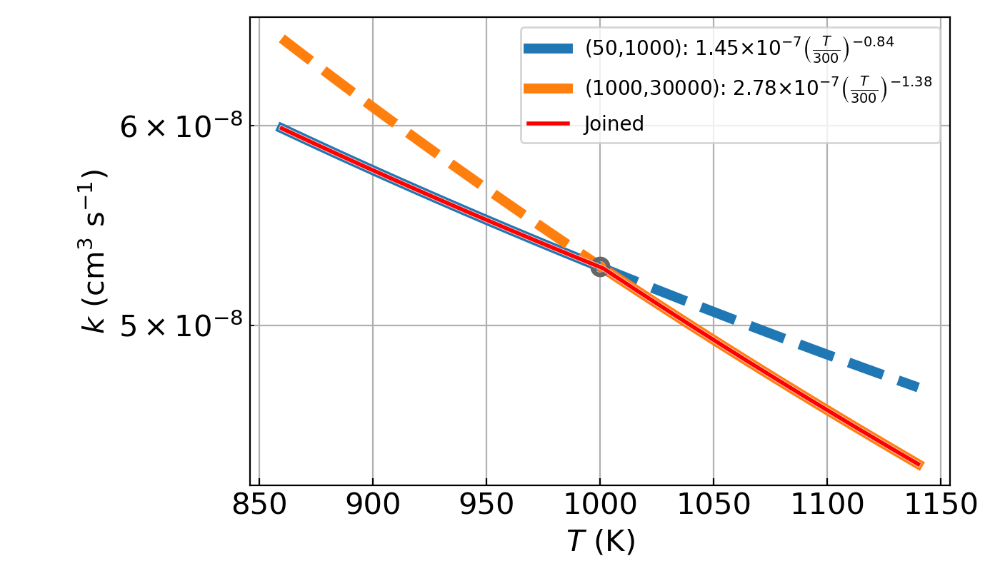

<IPython.core.display.Javascript object>


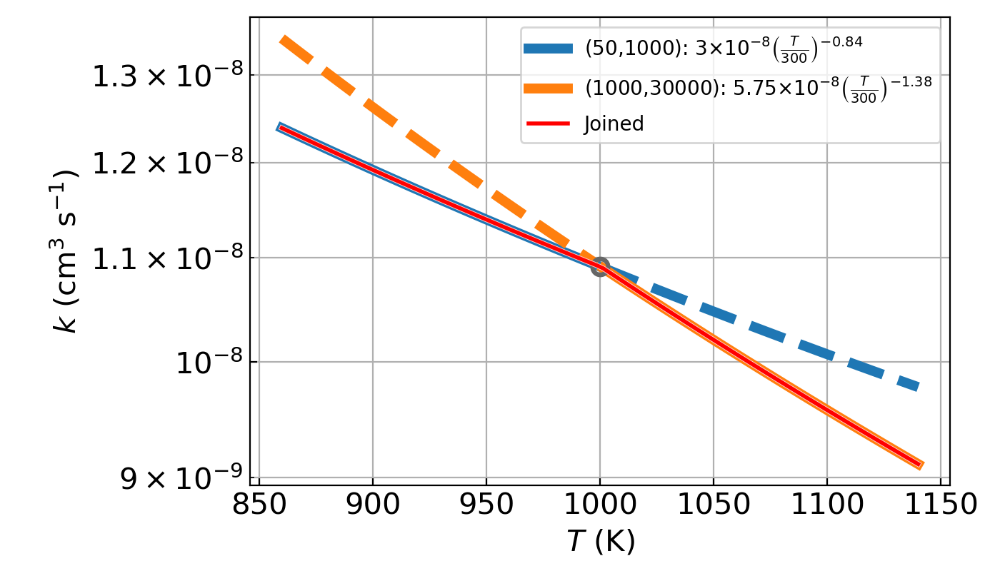

<IPython.core.display.Javascript object>


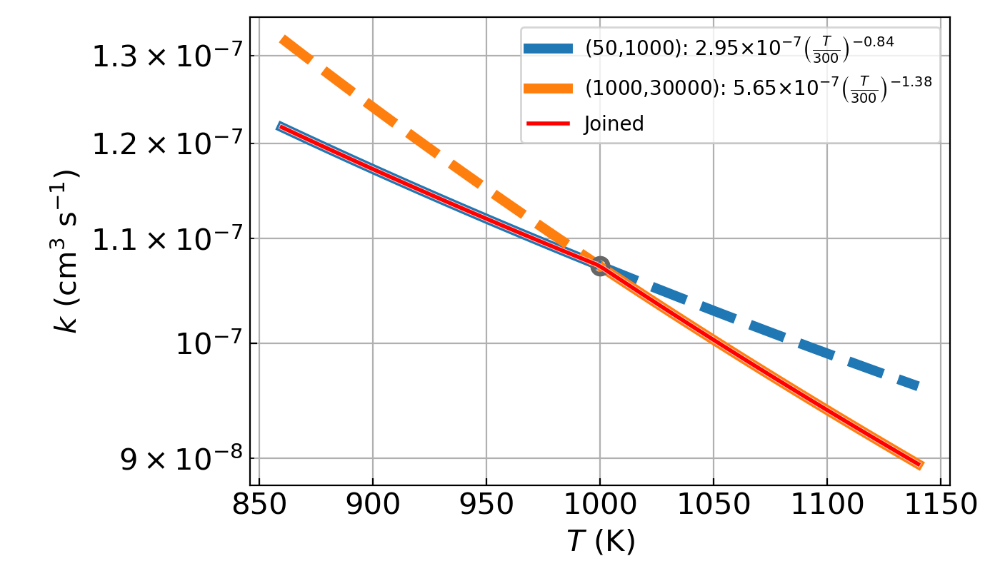

<IPython.core.display.Javascript object>


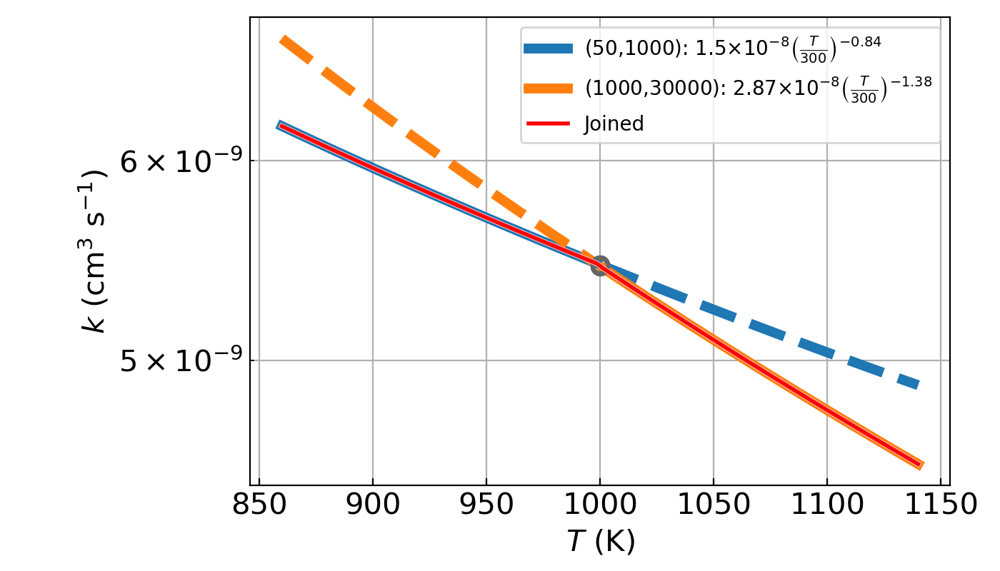

<IPython.core.display.Javascript object>


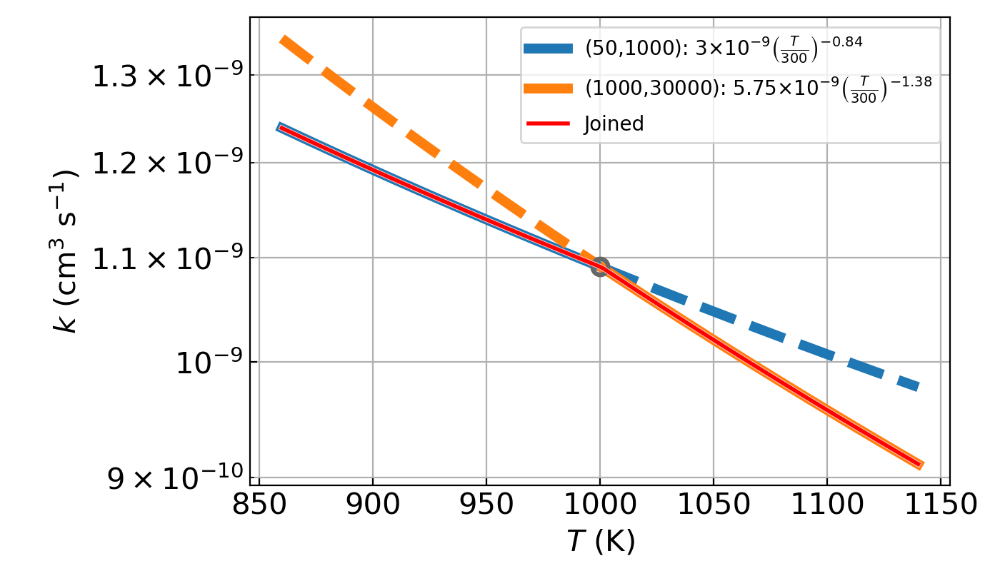

<IPython.core.display.Javascript object>


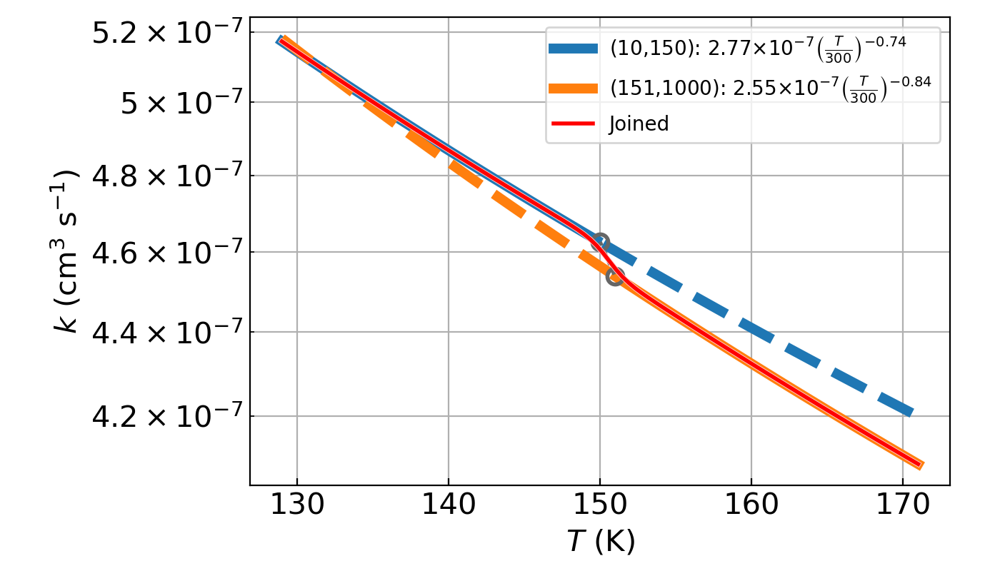

<IPython.core.display.Javascript object>


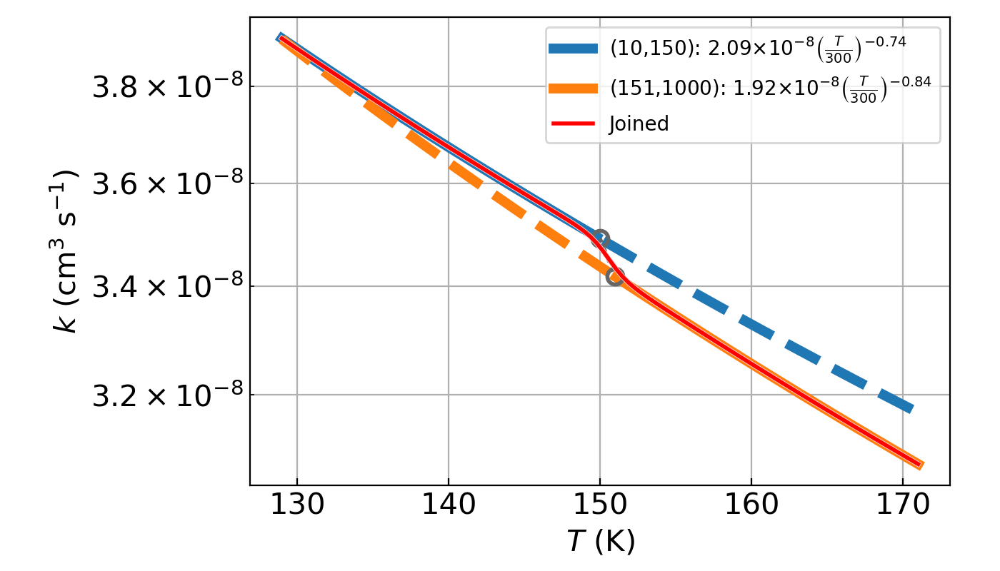

<IPython.core.display.Javascript object>


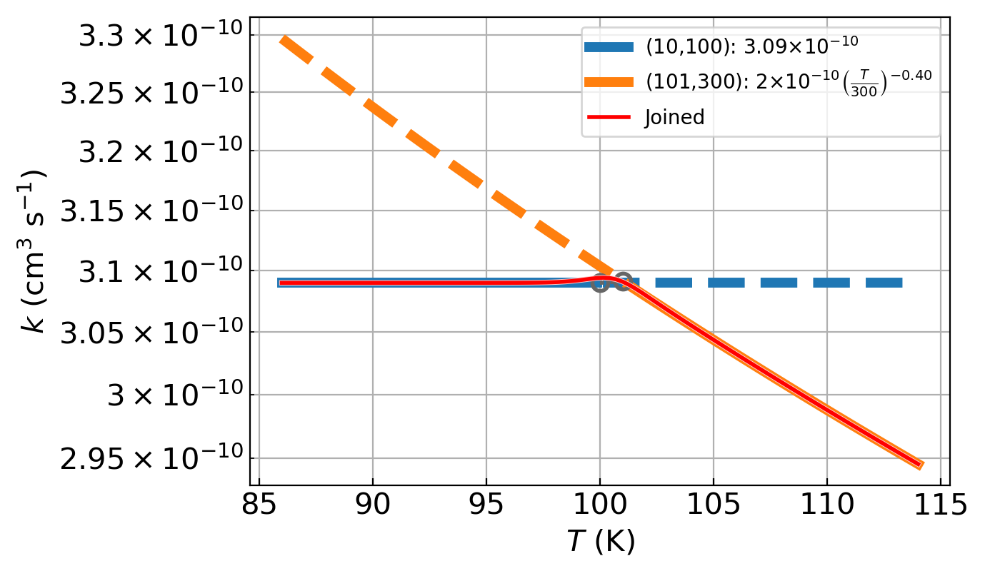

<IPython.core.display.Javascript object>


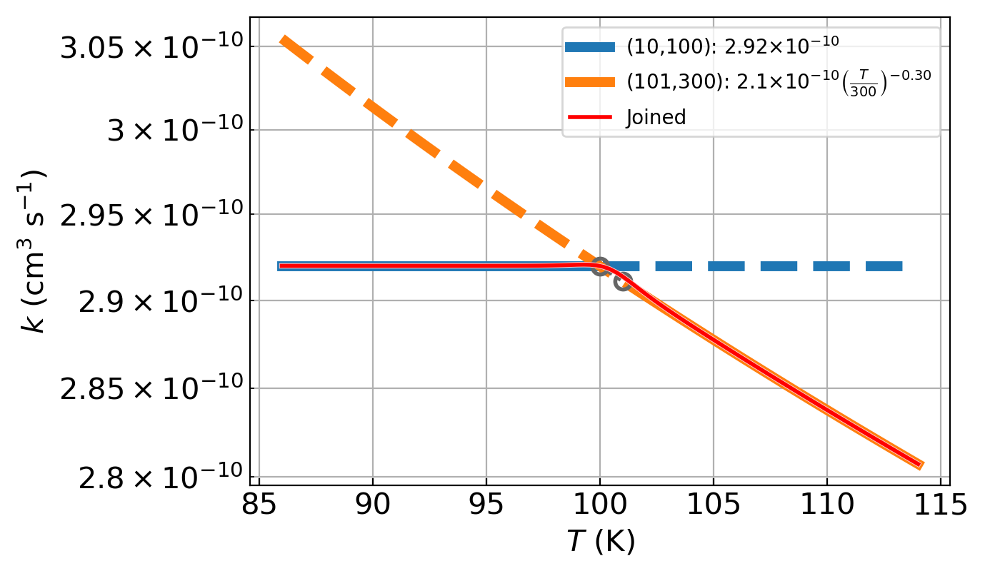

<IPython.core.display.Javascript object>


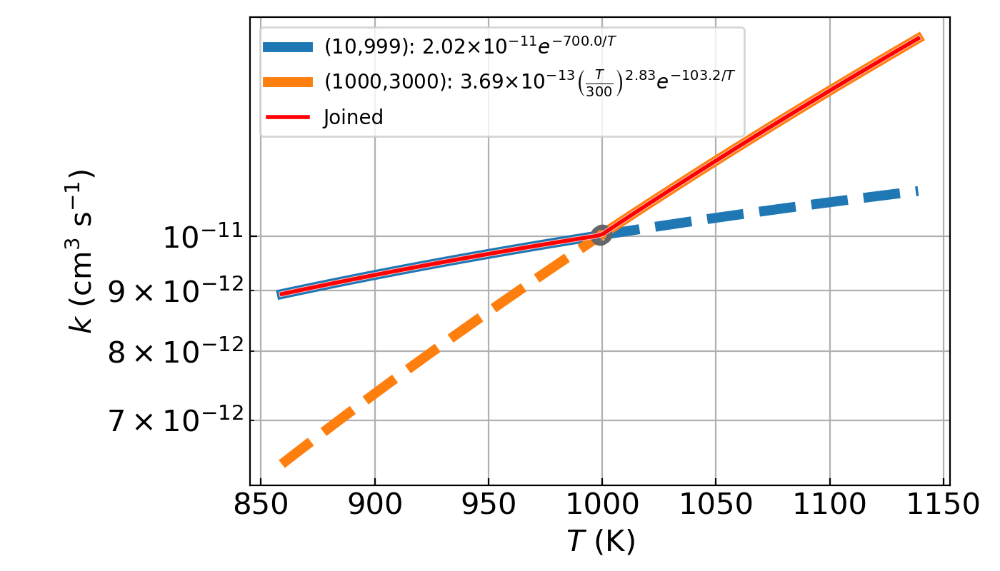

<IPython.core.display.Javascript object>


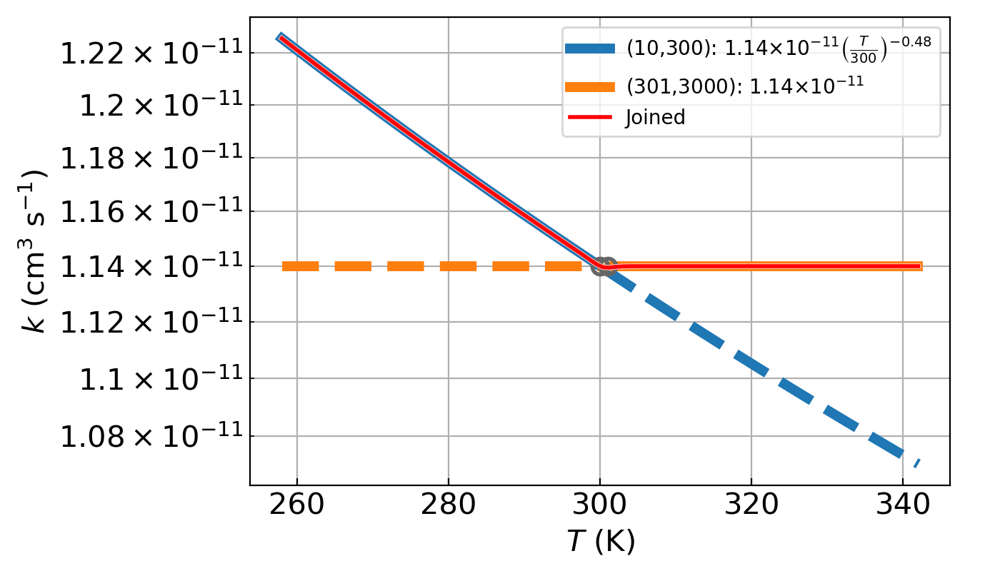

<IPython.core.display.Javascript object>


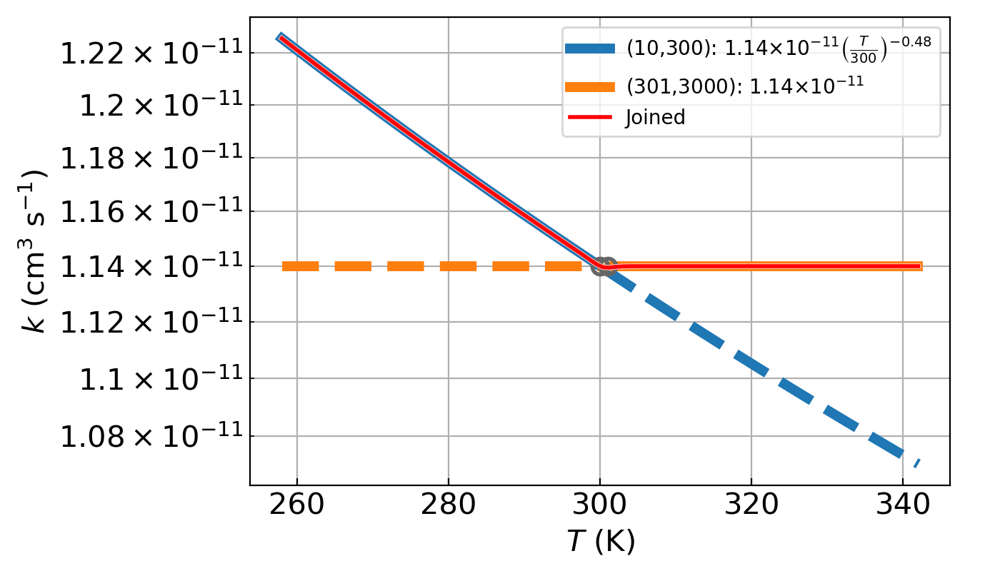

<IPython.core.display.Javascript object>


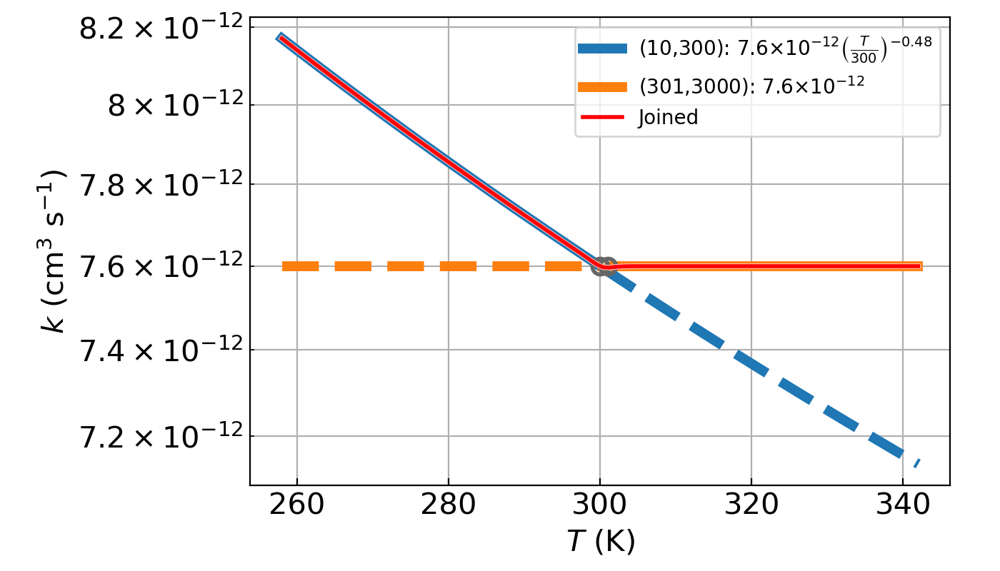

<IPython.core.display.Javascript object>


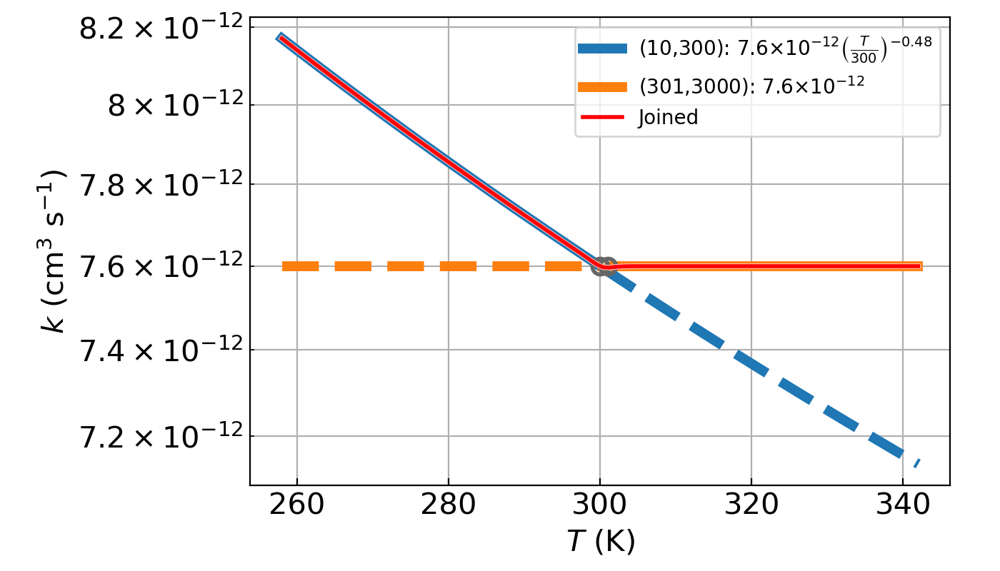

<IPython.core.display.Javascript object>


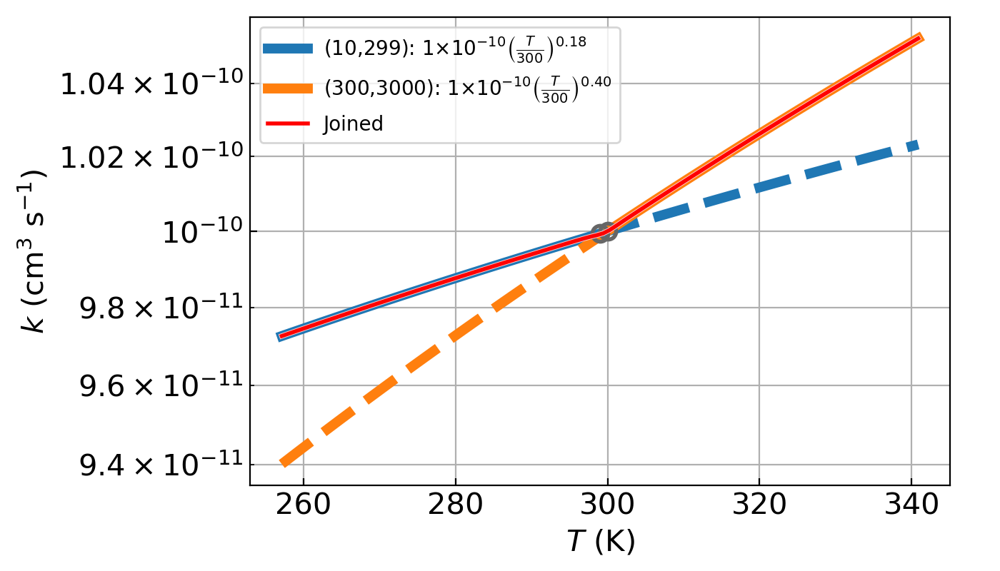

<IPython.core.display.Javascript object>


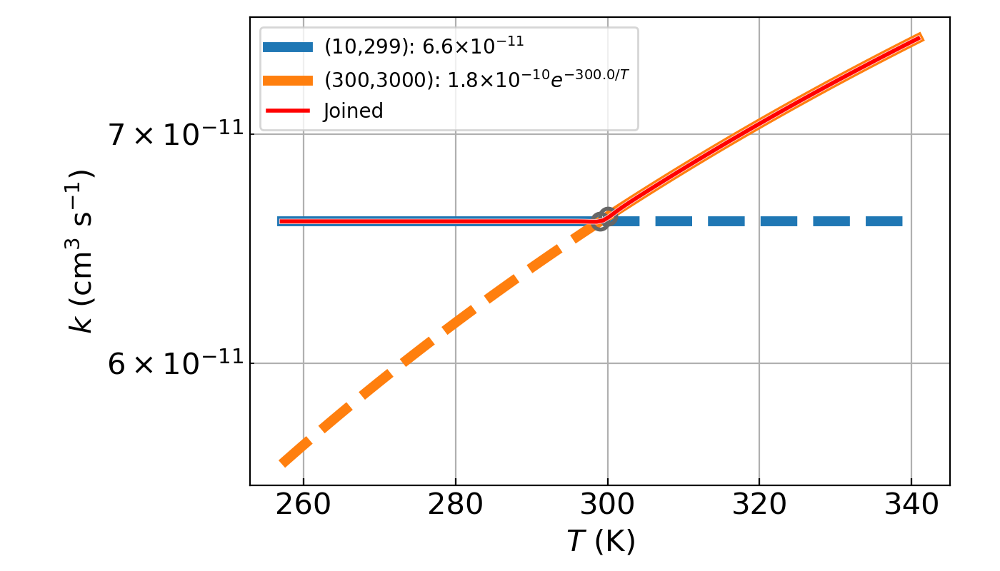

<IPython.core.display.Javascript object>


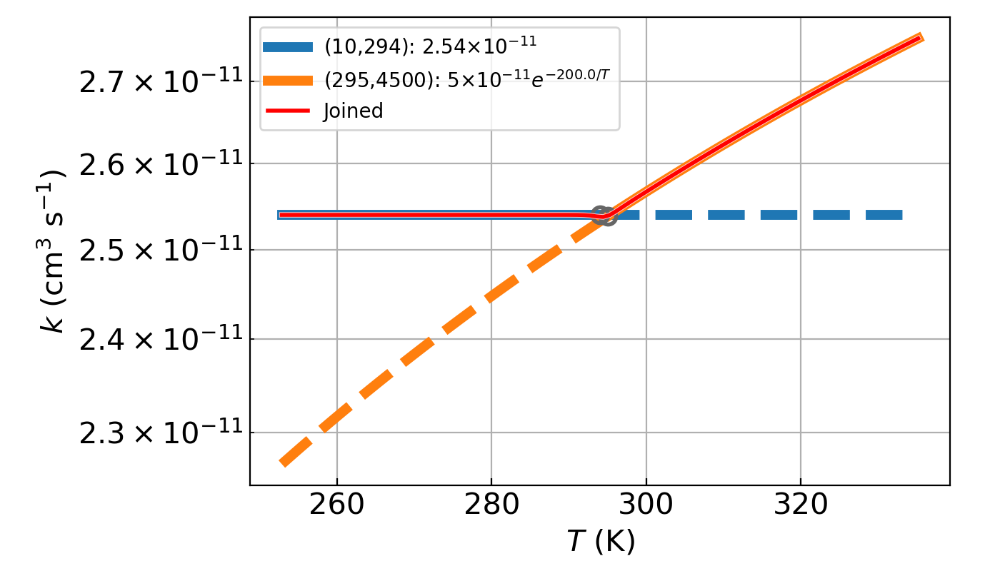

In [8]:
for i in range(0,len(model.duplicate_reactions)):
    fig = plt.figure(figsize=(7,4))
    ax = fig.add_axes([0.25,0.15,0.7,0.82])
    ax.grid(axis='both', which='both')
    ax.set_xlabel('$T$ (K)')
    ax.set_ylabel('$k$ (cm$^{3}$ s$^{-1}$)')
    check_discontinuity(model, i, ax, width=None)
    ax.legend(fontsize=10)
    ax.set_yscale('log')

In [9]:
# Free-fall time scale
print(np.sqrt(3*np.pi/32/cs.phy_GravitationConst_SI/(1e3*1e6*cs.phy_mProton_SI*1.4))/cs.phy_SecondsPerYear/1e6)

1.376540174285507


# Simple model

In [24]:
model0 = chempl.ChemModel(fReactions=b'rate12_noSurf_only_H2_formation.dat',
                          fSpeciesEnthalpies=b'Species_enthalpy.dat',
                          fInitialAbundances=b'initial_abundances.dat')
model0.setAbundanceByName(b'H', 5e-5)
model0.setAbundanceByName(b'C', 0.0)
model0.setAbundanceByName(b'C+', 1.4e-4)
model0.setAbundanceByName(b'S', 0.0)
model0.setAbundanceByName(b'S+', 8e-8)
model0.setAbundanceByName(b'Si', 0.0)
model0.setAbundanceByName(b'Si+', 8e-9)
model0.setAbundanceByName(b'Fe', 0.0)
model0.setAbundanceByName(b'Fe+', 3e-9)
model0.setAbundanceByName(b'Mg', 0.0)
model0.setAbundanceByName(b'Mg+', 7e-9)
model0.setAbundanceByName(b'Cl', 0.0)
model0.setAbundanceByName(b'Cl+', 4e-9)
model0.setAbundanceByName(b'Na', 0.0)
model0.setAbundanceByName(b'Na+', 2e-9)
model0.setAbundanceByName(b'P', 0.0)
model0.setAbundanceByName(b'P+', 3e-9)
model0.set_phy_params_by_dict(phy_params_default)
model0.prepare()
# Need to neutralize the overall abundances
model0.setAbundanceByName(b'E-', get_total_charge(model0.abundances, model0))

p_0 = {'nmax': 2000, 'dt0': 1e-1, 't_ratio': 1.08,
       't_max_s': 1e8*cs.phy_SecondsPerYear, 'model_id': 0,
       'phy_params': {b'T_gas': 10, b'T_dust': 10, b'n_gas': 2e4, b'chemdesorption_factor': 0.05,
                      b'Av': 10.0, b'Ncol_H2':1e22, b'G0_UV': 1e0, b'chi_cosmicray': 0.9558823529411765}}
res0 = run_one_model(p_0, model=model0)

Solver: 0 finished: 4.355569 seconds elapsed


In [4]:
for n in model0.name2idx:
    if model0.abundances[model0.name2idx[n]] >= 1e-10:
        print(chem2tex(n.decode()),
              ' & $'+sci2tex('{:.8e}'.format(model0.abundances[model0.name2idx[n]]))+'$ \\\\')

C$^{+}$  & $1.4{\times} 10^{-4}$ \\
Cl$^{+}$  & $4{\times} 10^{-9}$ \\
E$^{-}$  & $1.40107{\times} 10^{-4}$ \\
F  & $2{\times} 10^{-8}$ \\
Fe$^{+}$  & $3{\times} 10^{-9}$ \\
H  & $5{\times} 10^{-5}$ \\
H$_{2}$  & $5{\times} 10^{-1}$ \\
He  & $9{\times} 10^{-2}$ \\
Mg$^{+}$  & $7{\times} 10^{-9}$ \\
N  & $7.5{\times} 10^{-5}$ \\
Na$^{+}$  & $2{\times} 10^{-9}$ \\
O  & $3.2{\times} 10^{-4}$ \\
P$^{+}$  & $3{\times} 10^{-9}$ \\
S$^{+}$  & $8{\times} 10^{-8}$ \\
Si$^{+}$  & $8{\times} 10^{-9}$ \\


In [5]:
1.4e-4 + 4e-9 + 3e-9 + 7e-9 + 2e-9 + 3e-9 + 8e-8 + 8e-9

0.000140107

In [6]:
1.3e-17/cs.phy_cosmicray_ionization_rate

0.9558823529411765

In [7]:
def dict2latex(d):
    for k in d:
        print(k, ' & ', d[k])

In [8]:
dict2latex(model0.get_all_phy_params())

b'Av'  &  10.0
b'G0_UV'  &  1.0
b'Ncol_CO'  &  0.0
b'Ncol_H'  &  0.0
b'Ncol_H2'  &  1e+22
b'T_dust'  &  10.0
b'T_gas'  &  10.0
b'chemdesorption_factor'  &  0.05
b'chi_Xray'  &  0.0
b'chi_cosmicray'  &  0.9558823529411765
b'dust2gas_mass'  &  0.01
b'dust2gas_num'  &  2.7951629199813483e-12
b'dust_albedo'  &  0.6
b'dust_crosssec'  &  3.141592653589794e-10
b'dust_material_density'  &  2.0
b'dust_radius'  &  1e-05
b'dust_site_density'  &  1000000000000000.0
b'dv_km_s'  &  1.0
b'mean_mol_weight'  &  1.4
b'n_gas'  &  20000.0
b't_max_year'  &  10000000.0
b'v_km_s'  &  14.5


In [9]:
print(model0.get_all_phy_params())

{b'Av': 10.0, b'G0_UV': 1.0, b'Ncol_CO': 0.0, b'Ncol_H': 0.0, b'Ncol_H2': 1e+22, b'T_dust': 10.0, b'T_gas': 10.0, b'chemdesorption_factor': 0.05, b'chi_Xray': 0.0, b'chi_cosmicray': 0.9558823529411765, b'dust2gas_mass': 0.01, b'dust2gas_num': 2.7951629199813483e-12, b'dust_albedo': 0.6, b'dust_crosssec': 3.141592653589794e-10, b'dust_material_density': 2.0, b'dust_radius': 1e-05, b'dust_site_density': 1000000000000000.0, b'dv_km_s': 1.0, b'mean_mol_weight': 1.4, b'n_gas': 20000.0, b't_max_year': 10000000.0, b'v_km_s': 14.5}


In [10]:
def get_abundance_at_time(t, name, model, store):
    return chempl.simpleInterpol([_/cs.phy_SecondsPerYear for _ in store['ts']],
                                 [_[model.name2idx[name]] for _ in store['ys']], t)

<IPython.core.display.Javascript object>


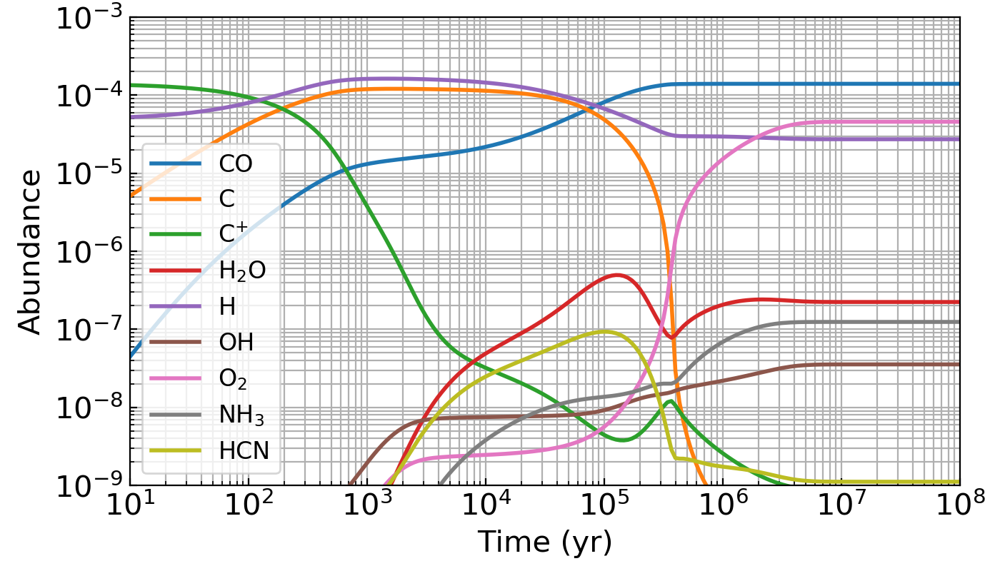

In [25]:
fig = plt.figure(figsize=(7,4))
ax = fig.add_axes([0.13,0.15,0.83,0.82])
ax.set_xlabel('Time (yr)')
ax.set_ylabel('Abundance')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim((1e1, 1e8))
ax.set_ylim((1e-9, 1e-3))
ax.grid(axis='both', which='both')

for s in [b'CO', b'C', b'C+', b'H2O', b'H', b'OH', b'O2', b'NH3', b'HCN']:
    ax.plot(np.array(res0['ts'])/cs.phy_SecondsPerYear,
            [_[model0.name2idx[s]] for _ in res0['ys']],
            label=chem2tex(s.decode()), lw=2)
ax.legend(fontsize=12)

## Use a more realistic network

In [26]:
model = chempl.ChemModel(fReactions=b'rate12_combined.dat',
                         fSpeciesEnthalpies=b'Species_enthalpy.dat',
                         fInitialAbundances=b'initial_abundances.dat')
model.setAbundanceByName(b'H', 5e-5)
model.setAbundanceByName(b'C', 0.0)
model.setAbundanceByName(b'C+', 1.4e-4)
model.setAbundanceByName(b'S', 0.0)
model.setAbundanceByName(b'S+', 8e-8)
model.setAbundanceByName(b'Si', 0.0)
model.setAbundanceByName(b'Si+', 8e-9)
model.setAbundanceByName(b'Fe', 0.0)
model.setAbundanceByName(b'Fe+', 3e-9)
model.setAbundanceByName(b'Mg', 0.0)
model.setAbundanceByName(b'Mg+', 7e-9)
model.setAbundanceByName(b'Cl', 0.0)
model.setAbundanceByName(b'Cl+', 4e-9)
model.setAbundanceByName(b'Na', 0.0)
model.setAbundanceByName(b'Na+', 2e-9)
model.setAbundanceByName(b'P', 0.0)
model.setAbundanceByName(b'P+', 3e-9)
model.set_phy_params_by_dict(phy_params_default)
model.prepare()
# Need to neutralize the overall abundances
model.setAbundanceByName(b'E-', get_total_charge(model.abundances, model))

p_0 = {'nmax': 2000, 'dt0': 1e-1, 't_ratio': 1.08,
       't_max_s': 1e8*cs.phy_SecondsPerYear, 'model_id': 0,
       'phy_params': {b'T_gas': 10, b'T_dust': 10, b'n_gas': 2e4, b'chemdesorption_factor':0.05,
                      b'Av': 10.0, b'Ncol_H2':1e22, b'G0_UV': 1e0, b'chi_cosmicray': 0.9558823529411765}}
res1 = run_one_model(p_0, model=model)

Solver: 0 finished: 13.859886 seconds elapsed


In [27]:
model.get_aux_info()

{'t_calc': 3153924976129125.5,
 'k_eva_tot': 2.844004977958284e-13,
 'k_ads_tot': 2.8441403370107207e-13,
 'mant_tot': 0.0004537573134302206,
 'surf_tot': 4.299186962339991e-06,
 'n_surf2mant': 101,
 'n_mant2surf': 101}

<IPython.core.display.Javascript object>


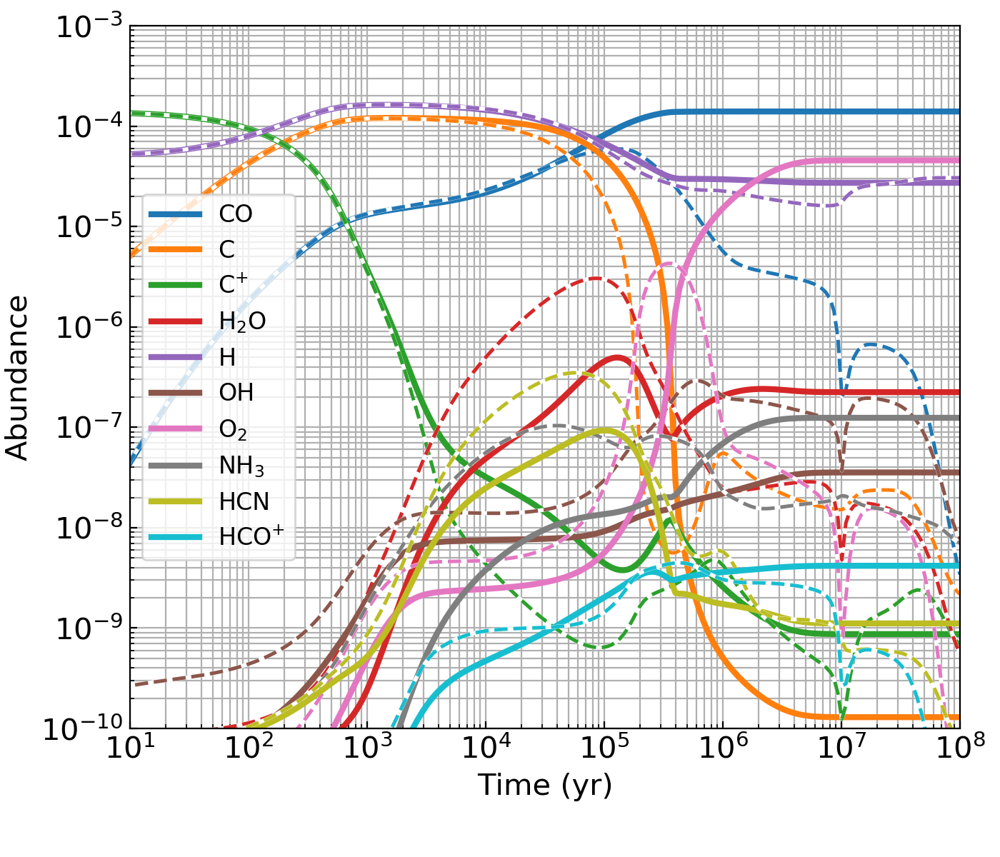

In [28]:
colors=[_['color'] for _ in _colc]

fig = plt.figure(figsize=(7,6))
ax = fig.add_axes([0.13,0.15,0.83,0.82])
ax.set_xlabel('Time (yr)')
ax.set_ylabel('Abundance')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim((1e1, 1e8))
ax.set_ylim((1e-10, 1e-3))
ax.grid(axis='both', which='both')

for i,s in enumerate([b'CO', b'C', b'C+', b'H2O', b'H', b'OH', b'O2', b'NH3', b'HCN', b'HCO+']):
    ax.plot(np.array(res0['ts'])/cs.phy_SecondsPerYear,
            [_[model0.name2idx[s]] for _ in res0['ys']] if model0.name2idx.get(s) else 0*np.array(res0['ts']),
            label=chem2tex(s.decode()), lw=3, ls='-', color=colors[i])
    ax.plot(np.array(res1['ts'])/cs.phy_SecondsPerYear,
            [_[model.name2idx[s]] for _ in res1['ys']],
            lw=2, ls='-', color='white')
    ax.plot(np.array(res1['ts'])/cs.phy_SecondsPerYear,
            [_[model.name2idx[s]] for _ in res1['ys']],
            lw=1.8, ls='--', color=colors[i])
ax.legend(fontsize=12)
#plt.savefig('simpleDarkCloudModel.pdf', bbox_inches='tight')

In [15]:
model.get_all_phy_params()

{b'Av': 10.0,
 b'G0_UV': 1.0,
 b'Ncol_CO': 0.0,
 b'Ncol_H': 0.0,
 b'Ncol_H2': 1e+22,
 b'T_dust': 10.0,
 b'T_gas': 10.0,
 b'chemdesorption_factor': 0.05,
 b'chi_Xray': 0.0,
 b'chi_cosmicray': 0.9558823529411765,
 b'dust2gas_mass': 0.01,
 b'dust2gas_num': 2.7951629199813483e-12,
 b'dust_albedo': 0.6,
 b'dust_crosssec': 3.141592653589794e-10,
 b'dust_material_density': 2.0,
 b'dust_radius': 1e-05,
 b'dust_site_density': 1000000000000000.0,
 b'dv_km_s': 1.0,
 b'mean_mol_weight': 1.4,
 b'n_gas': 20000.0,
 b't_max_year': 10000000.0,
 b'v_km_s': 14.5}

## Test modifying the parameter of one reaction

In [32]:
for i,r in enumerate(model.reactions):
    if set(r['reactants']) == set([b'C2H', b'O']):
        i_ = i
        print(i, r)

model.modify_reaction(i_, {b'abc': [1.7e-11, 0.0, 0.0]})
for i,r in enumerate(model.reactions):
    if set(r['reactants']) == set([b'C2H', b'O']):
        print(i, r)

5563 {'reactants': [b'O', b'C2H'], 'products': [b'CO', b'CH'], 'abc': [1e-10, 0.0, 0.0], 'Trange': [10.0, 2500.0], 'itype': 5, 'drdy': [nan, nan], 'rate': 0.0, 'heat': nan}
5563 {'reactants': [b'O', b'C2H'], 'products': [b'CO', b'CH'], 'abc': [1.7e-11, 0.0, 0.0], 'Trange': [10.0, 2500.0], 'itype': 5, 'drdy': [nan, nan], 'rate': 0.0, 'heat': nan}


In [18]:
res0 = run_one_model(p_0, model=model)

Solver: 0 finished: 14.702534 seconds elapsed


In [19]:
for s in [b'C2H']:
    ax.plot(np.array(res0['ts'])/cs.phy_SecondsPerYear,
            [_[model.name2idx[s]] for _ in res0['ys']],
            label=s.decode(), lw=4, color='k')
ax.set_ylim((1e-9, 4e-7))

(1e-09, 4e-07)

# Test the implementation of time-dependency of physical parameters 

## Test the home-made function simpleInterpol

It is used in the code for interpolating the physical parameters

<IPython.core.display.Javascript object>


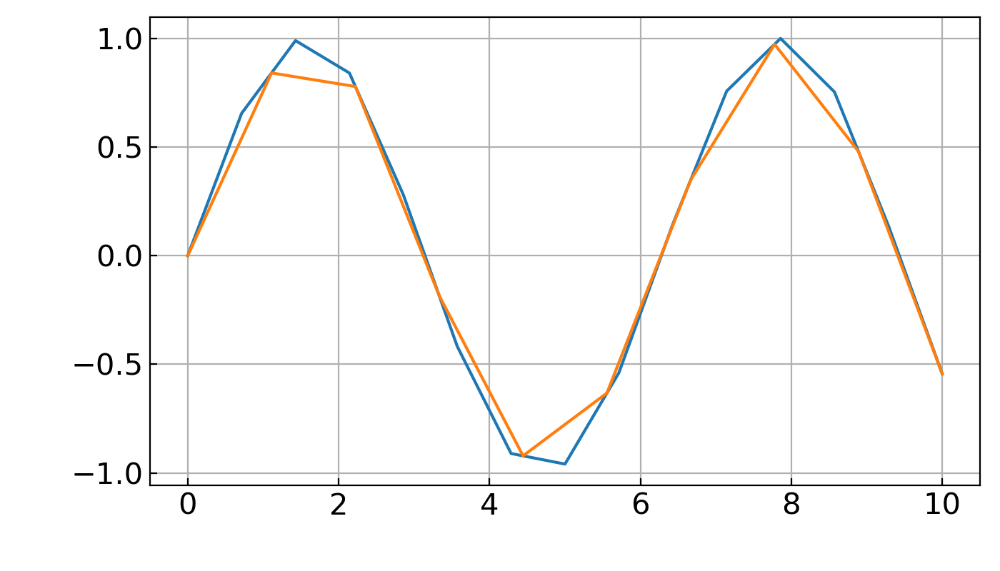

In [33]:
ts = np.linspace(0, 10, num=15)
vs = np.sin(ts)

fig = plt.figure(figsize=(7,4))
ax = fig.add_axes([0.15,0.15,0.83,0.82])
ax.grid(axis='both', which='both')
ax.plot(ts, vs)

ts1 = np.linspace(0, 10, num=10)
vs1 = [chempl.simpleInterpol(ts, vs, _) for _ in ts1]
ax.plot(ts1, vs1)

## A toy model with time-dependent temperature and density

In [34]:
ts = np.logspace(0, 5.6, num=500)
Tgas_s = 10.0 + 150*np.exp(-0.2*((ts-1e5)/1e4)**2)
Tdust_s = 10.0 + 50*np.exp(-0.2*((ts-1e5)/1e4)**2)
n_gas_s = 1e3 + 9e5 / (1 + 1e3*np.exp(-(ts-9e4)/4e3))

In [35]:
solver = chempl.ChemModel()
solver.load_reactions(b'rate12_combined_no_surface_reaction.dat')
solver.loadSpeciesEnthalpies(b'Species_enthalpy.dat')
solver.loadInitialAbundances(b'initial_abundances.dat')
solver.set_phy_params_by_dict(phy_params_default)

solver.add_time_dependency(b'T_gas', ts*cs.phy_SecondsPerYear, Tgas_s)
solver.add_time_dependency(b'T_dust', ts*cs.phy_SecondsPerYear, Tdust_s)
solver.add_time_dependency(b'n_gas', ts*cs.phy_SecondsPerYear, n_gas_s)

p_0 = {'nmax': 4000, 'dt0': 1e-1, 't_ratio': 1.01,
       't_max_s': 1e7*cs.phy_SecondsPerYear, 'model_id': 0,
       'phy_params': {b'G0_UV': 1.0, b'chi_cosmicray': 1e0,
                      b'Av': 10.0, b'Ncol_H2': 1e22}}
res0 = run_one_model(p_0, model=solver)

Solver: 0 finished: 34.688092 seconds elapsed


In [36]:
t = np.array(res0['ts']) / cs.phy_SecondsPerYear
Tg_s = [_[b'T_gas'] for _ in res0['phy_s']]
Td_s = [_[b'T_dust'] for _ in res0['phy_s']]
ng_s = [_[b'n_gas'] for _ in res0['phy_s']]

<IPython.core.display.Javascript object>


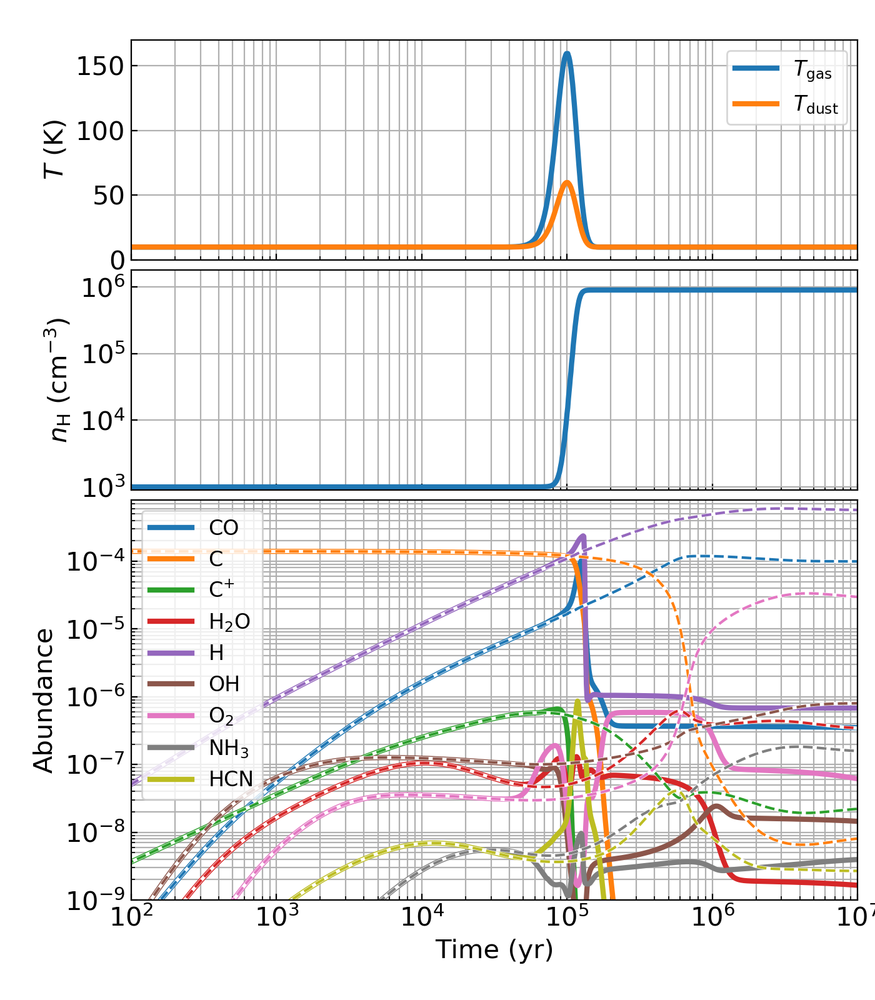

In [37]:
xlim = (1e2,1e7)
fig = plt.figure(figsize=(7,8))
ax = fig.add_axes([0.15,0.74,0.83,0.22])
ax.set_ylabel('$T$ (K)')
ax.set_xscale('log')
ax.set_yscale('linear')
ax.set_xlim(xlim)
ax.set_ylim((0,170))
ax.set_xticklabels([])
ax.grid(axis='both', which='both')
ax.plot(t, Tg_s, label='$T_{\\rm gas}$', lw=3)
ax.plot(t, Td_s, label='$T_{\\rm dust}$', lw=3)
ax.legend(fontsize=12)
ax = fig.add_axes([0.15,0.51,0.83,0.22])
ax.set_ylabel('$n_{\\rm H}$ (cm$^{-3}$)')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim(xlim)
ax.set_ylim((0.9e3,1.8e6))
ax.set_xticklabels([])
ax.set_yticks([1e3,1e4,1e5,1e6])
ax.grid(axis='both', which='both')
ax.plot(t, ng_s, lw=3)
ax = fig.add_axes([0.15,0.1,0.83,0.4])
ax.set_xlabel('Time (yr)')
ax.set_ylabel('Abundance')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim(xlim)
ax.set_ylim((1e-9, 8e-4))
ax.grid(axis='both', which='both')
for i,s in enumerate([b'CO', b'C', b'C+', b'H2O', b'H', b'OH', b'O2', b'NH3', b'HCN']):
    ax.plot(t, [_[solver.name2idx[s]] for _ in res0['ys']],
            label=chem2tex(s.decode()), color=[_['color'] for _ in _colc][i], lw=3)
ax.legend(fontsize=12)

In [38]:
solver.remove_time_dependency(b'n_gas')
solver.remove_time_dependency(b'T_gas')
solver.remove_time_dependency(b'T_dust')

p_0 = {'nmax': 4000, 'dt0': 1e-1, 't_ratio': 1.01,
       't_max_s': 1e7*cs.phy_SecondsPerYear, 'model_id': 0,
       'phy_params': {b'G0_UV': 1.0, b'chi_cosmicray':1e0,
                      b'T_gas': 10.0, b'T_dust': 10.0, b'n_gas': 1e3,
                      b'Av': 10.0, b'Ncol_H2': 1e22}}
res1 = run_one_model(p_0, model=solver)
for i,s in enumerate([b'CO', b'C', b'C+', b'H2O', b'H', b'OH', b'O2', b'NH3', b'HCN']):
    ax.plot(t, [_[solver.name2idx[s]] for _ in res1['ys']],
            lw=2, color='white')
    ax.plot(t, [_[solver.name2idx[s]] for _ in res1['ys']],
            color=[_['color'] for _ in _colc][i], lw=1.5, ls='--')

Solver: 0 finished: 5.503911 seconds elapsed


In [33]:
#plt.savefig('timeDependent.pdf', bbox_inches='tight')

## Another one

With temperature and density changing semi-randomly

In [39]:
ts = np.logspace(2, 7, num=4000)
ph_s = [1e3, 5e3, 1e4, 1e5, 1e6]
pt_s = [1e3, 5e3, 1e4, 1e5, 1e6]
amp_s = [0.1, 0.5, 3.0, 20.0, 5.0]
Tgas_s = 40.0
Tdust_s = 25.0
n_gas_s = 6e2
for p,pt,a in zip(ph_s, pt_s, amp_s):
    Tgas_s = Tgas_s + a * np.sin((ts-pt)/(p))
    Tdust_s = Tdust_s + a/1.5 * np.sin((ts-pt)/(p))
    n_gas_s = n_gas_s + 1e0*a**4 * np.abs(np.sin(1+(ts-pt)/(p)))

<IPython.core.display.Javascript object>


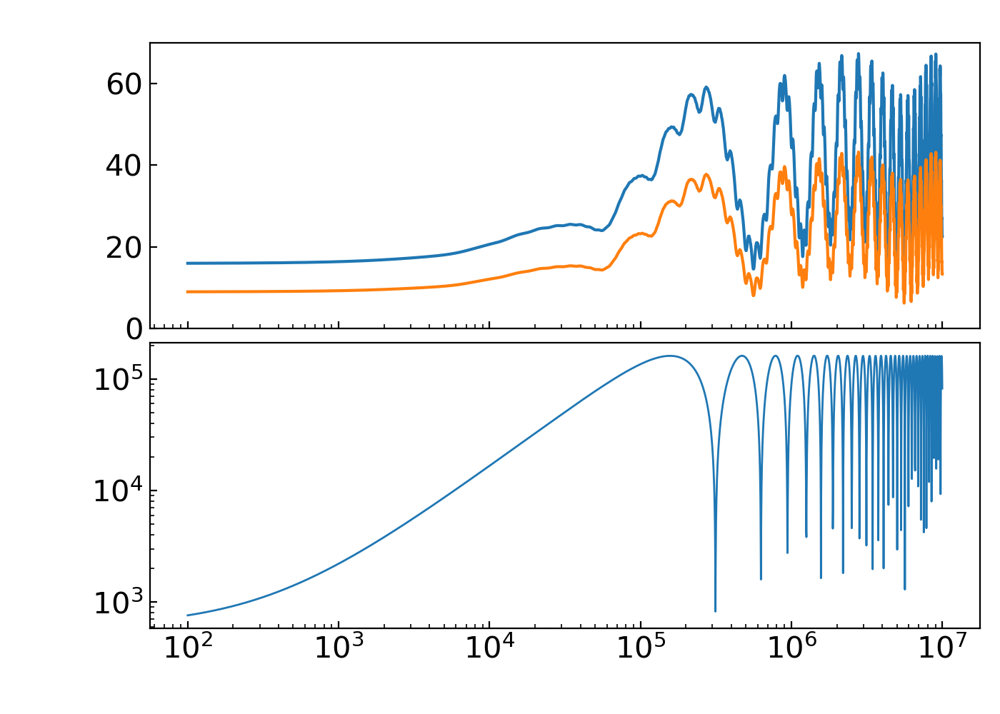

In [41]:
fig = plt.figure(figsize=(7,5))
ax = fig.add_axes([0.15,0.54,0.83,0.4])
ax.plot(ts, Tgas_s)
ax.plot(ts, Tdust_s)
ax.set_xscale('log')
ax.set_ylim((0, 70))
ax.set_xticklabels([])
ax = fig.add_axes([0.15,0.12,0.83,0.4])
ax.set_xscale('log')
ax.set_yscale('log')
ax.plot(ts, n_gas_s, lw=1)

In [42]:
solver = chempl.ChemModel()
solver.load_reactions(b'rate12_combined_no_surface_reaction.dat')
solver.loadSpeciesEnthalpies(b'Species_enthalpy.dat')
solver.loadInitialAbundances(b'initial_abundances.dat')
solver.set_phy_params_by_dict(phy_params_default)

solver.add_time_dependency(b'T_gas', ts*cs.phy_SecondsPerYear, Tgas_s)
solver.add_time_dependency(b'T_dust', ts*cs.phy_SecondsPerYear, Tdust_s)
solver.add_time_dependency(b'n_gas', ts*cs.phy_SecondsPerYear, n_gas_s)

p_0 = {'nmax': 9000, 'dt0': 1e-1, 't_ratio': 1.005,
       't_max_s': 1e7*cs.phy_SecondsPerYear, 'model_id': 0,
       'phy_params': {b'G0_UV': 1.0, b'chi_cosmicray':1e0,
                      b'Av': 10.0, b'Ncol_H2': 1e22}}
solver.prepare()
solver.set_solver()
res0 = run_one_model(p_0, model=solver)

Solver: 0 finished: 744.464595 seconds elapsed


<IPython.core.display.Javascript object>


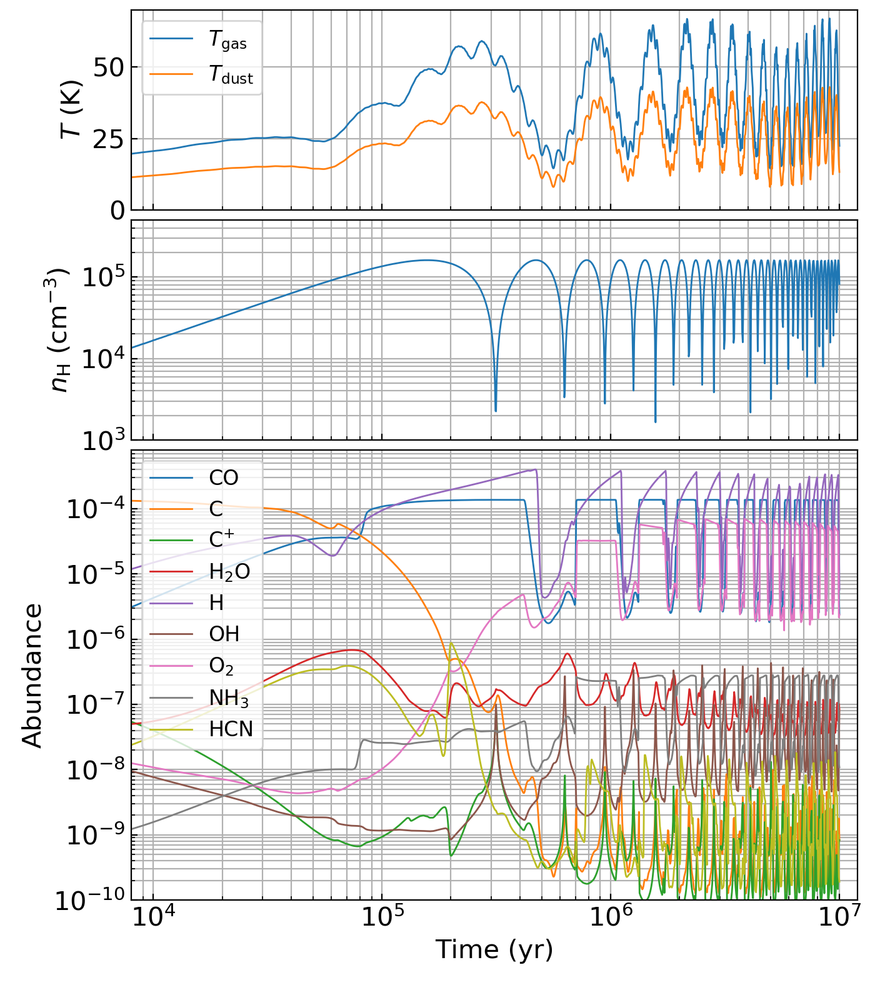

In [43]:
t = np.array(res0['ts']) / cs.phy_SecondsPerYear
Tg_s = [_[b'T_gas'] for _ in res0['phy_s']]
Td_s = [_[b'T_dust'] for _ in res0['phy_s']]
ng_s = [_[b'n_gas'] for _ in res0['phy_s']]

xlim = (8e3,1.2e7)
xscale = 'log'
fig = plt.figure(figsize=(7,8))
ax = fig.add_axes([0.15,0.79,0.83,0.2])
ax.set_ylabel('$T$ (K)')
ax.set_xscale(xscale)
ax.set_yscale('linear')
ax.set_xlim(xlim)
ax.set_ylim((0,70))
ax.set_xticklabels([])
ax.grid(axis='both', which='both')
ax.plot(t, Tg_s, label='$T_{\\rm gas}$', lw=1)
ax.plot(t, Td_s, label='$T_{\\rm dust}$', lw=1)
ax.legend(fontsize=12)
ax = fig.add_axes([0.15,0.56,0.83,0.22])
ax.set_ylabel('$n_{\\rm H}$ (cm$^{-3}$)')
ax.set_xscale(xscale)
ax.set_yscale('log')
ax.set_xlim(xlim)
ax.set_ylim((1e3,5e5))
ax.set_xticklabels([])
ax.grid(axis='both', which='both')
ax.plot(t, ng_s, lw=1)
ax = fig.add_axes([0.15,0.1,0.83,0.45])
ax.set_xlabel('Time (yr)')
ax.set_ylabel('Abundance')
ax.set_xscale(xscale)
ax.set_yscale('log')
ax.set_xlim(xlim)
ax.set_ylim((1e-10, 8e-4))
ax.grid(axis='both', which='both')
for i,s in enumerate([b'CO', b'C', b'C+', b'H2O', b'H', b'OH', b'O2', b'NH3', b'HCN']):
    ax.plot(t, [_[solver.name2idx[s]] for _ in res0['ys']],
            label=chem2tex(s.decode()), color=[_['color'] for _ in _colc][i], lw=1)
ax.legend(fontsize=12, loc='upper left')

In [38]:
#plt.savefig('timeDependent_rand.pdf', bbox_inches='tight')

In [44]:
with open('timeDependent_rand.pickle', 'wb') as f:
    pickle.dump(res0, f)

In [40]:
# with open('timeDependent_rand.pickle', 'rb') as f:
#     res0 = pickle.load(f)

In [45]:
mtest = chempl.ChemModel()
mtest.load_reactions(b'rate12_combined_no_surface_reaction.dat')
mtest.loadSpeciesEnthalpies(b'Species_enthalpy.dat')
mtest.setAbundances(res0['ys'][5558])
mtest.set_phy_params_by_dict(phy_params_default)
n = 2000
ts = np.logspace(1, 6, num=n)
n_gas_s = 1.1e3 + 1e5*np.abs(np.sin(3*np.log(ts)))
mtest.add_time_dependency(b'n_gas', ts*cs.phy_SecondsPerYear, n_gas_s)

p_0 = {'nmax': 8000, 'dt0': 1e-1, 't_ratio': 1.006,
       't_max_s': 1e7*cs.phy_SecondsPerYear, 'model_id': 0,
       'phy_params': {b'G0_UV': 1.0, b'chi_cosmicray':1e0,
                      b'T_gas': 18.0, b'T_dust': 10.0,
                      b'Av': 10.0, b'Ncol_H2': 1e22}}
rtest = run_one_model(p_0, model=mtest)

Solver: 0 finished: 76.841437 seconds elapsed


In [46]:
mtest1 = chempl.ChemModel()
mtest1.load_reactions(b'rate12_combined_no_surface_reaction.dat')
mtest1.loadSpeciesEnthalpies(b'Species_enthalpy.dat')
mtest1.setAbundances(res0['ys'][5558])
mtest1.set_phy_params_by_dict(phy_params_default)
n = 2000
ts = np.logspace(1, 6, num=n)
n_gas_s = 1.1e3 + 1e5*np.abs(np.sin(3*np.log(ts)))
mtest1.add_time_dependency(b'n_gas', ts*cs.phy_SecondsPerYear, n_gas_s)

p_0 = {'nmax': 8000, 'dt0': 1e-1, 't_ratio': 1.006,
       't_max_s': 1e7*cs.phy_SecondsPerYear, 'model_id': 0,
       'phy_params': {b'G0_UV': 1.0, b'chi_cosmicray':1e2,
                      b'T_gas': 18.0, b'T_dust': 10.0,
                      b'Av': 10.0, b'Ncol_H2': 1e22}}
rtest1 = run_one_model(p_0, model=mtest1)

Solver: 0 finished: 91.307379 seconds elapsed


<IPython.core.display.Javascript object>


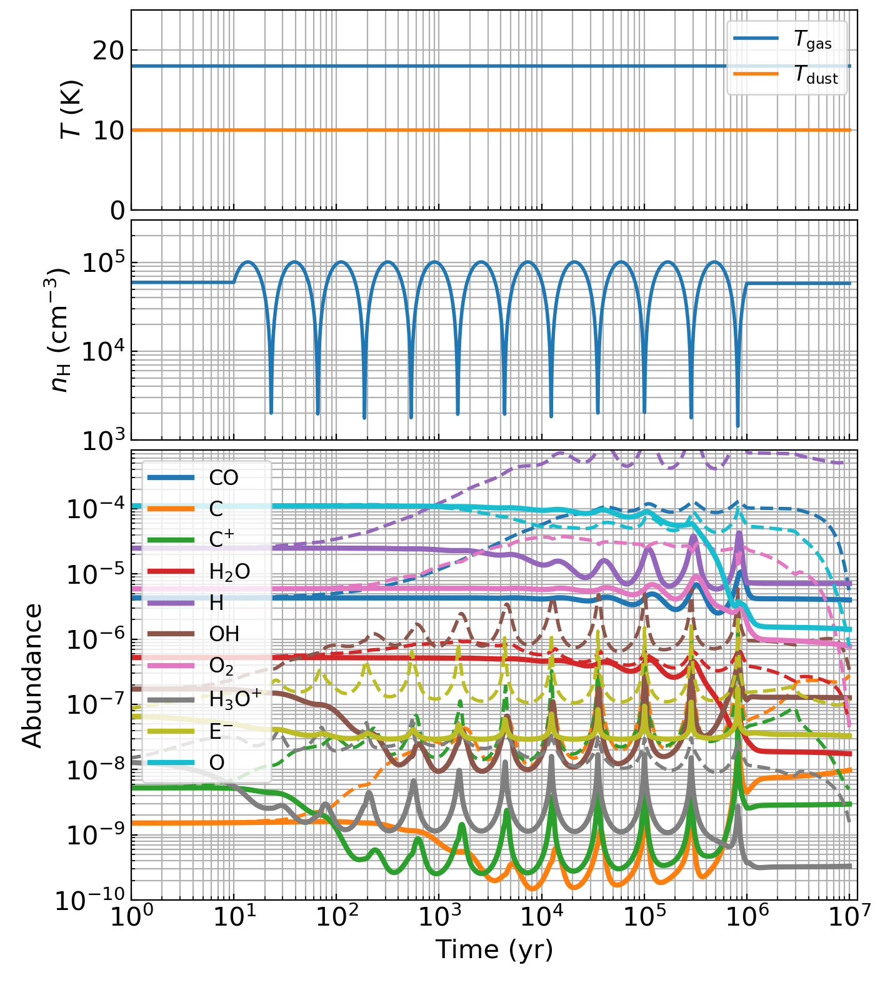

In [47]:
t = np.array(rtest['ts']) / cs.phy_SecondsPerYear
Tg_s = [_[b'T_gas'] for _ in rtest['phy_s']]
Td_s = [_[b'T_dust'] for _ in rtest['phy_s']]
ng_s = [_[b'n_gas'] for _ in rtest['phy_s']]

xlim = (1e0,1.2e7)
xscale = 'log'
fig = plt.figure(figsize=(7,8))
ax = fig.add_axes([0.15,0.79,0.83,0.2])
ax.set_ylabel('$T$ (K)')
ax.set_xscale(xscale)
ax.set_yscale('linear')
ax.set_xlim(xlim)
ax.set_ylim((0,25))
ax.set_xticklabels([])
ax.grid(axis='both', which='both')
ax.plot(t, Tg_s, label='$T_{\\rm gas}$', lw=2)
ax.plot(t, Td_s, label='$T_{\\rm dust}$', lw=2)
ax.legend(fontsize=12)
ax = fig.add_axes([0.15,0.56,0.83,0.22])
ax.set_ylabel('$n_{\\rm H}$ (cm$^{-3}$)')
ax.set_xscale(xscale)
ax.set_yscale('log')
ax.set_xlim(xlim)
ax.set_ylim((1e3,3e5))
ax.set_xticklabels([])
ax.grid(axis='both', which='both')
ax.plot(t, ng_s, lw=2)
ax = fig.add_axes([0.15,0.1,0.83,0.45])
ax.set_xlabel('Time (yr)')
ax.set_ylabel('Abundance')
ax.set_xscale(xscale)
ax.set_yscale('log')
ax.set_xlim(xlim)
ax.set_ylim((1e-10, 8e-4))
ax.grid(axis='both', which='both')
for i,s in enumerate([b'CO', b'C', b'C+', b'H2O', b'H', b'OH', b'O2', b'H3O+', b'E-', b'O']):
    ax.plot(t, [_[mtest.name2idx[s]] for _ in rtest['ys']],
            label=chem2tex(s.decode()), color=[_['color'] for _ in _colc][i], lw=3)
    ax.plot(t, [_[mtest1.name2idx[s]] for _ in rtest1['ys']],
            color=[_['color'] for _ in _colc][i], lw=2, ls='--')
ax.legend(fontsize=12, loc='upper left')

In [48]:
printFormationDestruction(b'OH', solver, res0, tmin=6.267e+05, tmax=6.3035e+05, nstep=1)

Time      total_f   total_d   tscale_n tscale_f tscale_d Tg    Td    ngas     y        tidx
6.268e+05 4.588e-18 3.313e-18 4.27e+03 1.19e+03 1.64e+03 17.91 10.27 3.38e+03 1.72e-07 5558
3.856e-18 H3O+ + E-  ->  OH + H + H [3.05e-07, -0.5, 0.0] 1295
6.790e-19 H3O+ + E-  ->  OH + H2 [5.37e-08, -0.5, 0.0] 1294
-2.486e-18 O + OH  ->  O2 + H [3.69e-11, -0.27, 12.9] 5642
-7.338e-19 N + OH  ->  NO + H [6.05e-11, -0.23, 14.9] 5495
Time      total_f   total_d   tscale_n  tscale_f tscale_d Tg    Td    ngas     y        tidx
6.303e+05 5.113e-18 6.765e-18 -5.21e+03 1.68e+03 1.27e+03 19.23 11.15 4.16e+03 2.71e-07 5559
4.271e-18 H3O+ + E-  ->  OH + H + H [3.05e-07, -0.5, 0.0] 1295
7.519e-19 H3O+ + E-  ->  OH + H2 [5.37e-08, -0.5, 0.0] 1294
-5.066e-18 O + OH  ->  O2 + H [3.69e-11, -0.27, 12.9] 5642
-1.513e-18 N + OH  ->  NO + H [6.05e-11, -0.23, 14.9] 5495


In [49]:
printFormationDestruction(b'H3O+', solver, res0, tmin=6.267e+05, tmax=6.3035e+05, nstep=1)

Time      total_f   total_d   tscale_n tscale_f tscale_d Tg    Td    ngas     y        tidx
6.268e+05 5.628e-18 5.529e-18 4.25e+03 7.43e+01 7.56e+01 17.91 10.27 3.38e+03 1.32e-08 5558
5.277e-18 H2 + H2O+  ->  H3O+ + H [6.4e-10, 0.0, 0.0] 2661
-3.856e-18 H3O+ + E-  ->  OH + H + H [3.05e-07, -0.5, 0.0] 1295
-8.965e-19 H3O+ + E-  ->  H2O + H [7.09e-08, -0.5, 0.0] 1292
-6.790e-19 H3O+ + E-  ->  OH + H2 [5.37e-08, -0.5, 0.0] 1294
Time      total_f   total_d   tscale_n  tscale_f tscale_d Tg    Td    ngas     y        tidx
6.303e+05 6.060e-18 6.124e-18 -5.96e+03 6.28e+01 6.22e+01 19.23 11.15 4.16e+03 1.20e-08 5559
5.684e-18 H2 + H2O+  ->  H3O+ + H [6.4e-10, 0.0, 0.0] 2661
-4.271e-18 H3O+ + E-  ->  OH + H + H [3.05e-07, -0.5, 0.0] 1295
-9.927e-19 H3O+ + E-  ->  H2O + H [7.09e-08, -0.5, 0.0] 1292
-7.519e-19 H3O+ + E-  ->  OH + H2 [5.37e-08, -0.5, 0.0] 1294


In [50]:
printFormationDestruction(b'H2O+', solver, res0, tmin=6.267e+05, tmax=6.3035e+05, nstep=1)

Time      total_f   total_d   tscale_n tscale_f tscale_d Tg    Td    ngas     y        tidx
6.268e+05 5.280e-18 5.280e-18 2.30e+03 2.93e-02 2.93e-02 17.91 10.27 3.38e+03 4.89e-12 5558
3.708e-18 H2 + OH+  ->  H2O+ + H [1.01e-09, 0.0, 0.0] 2688
1.419e-18 H3+ + O  ->  H2O+ + H [3.42e-10, -0.16, 1.4] 2949
-5.277e-18 H2 + H2O+  ->  H3O+ + H [6.4e-10, 0.0, 0.0] 2661
Time      total_f   total_d   tscale_n  tscale_f tscale_d Tg    Td    ngas     y        tidx
6.303e+05 5.686e-18 5.686e-18 -2.50e+03 2.38e-02 2.38e-02 19.23 11.15 4.16e+03 4.26e-12 5559
3.996e-18 H2 + OH+  ->  H2O+ + H [1.01e-09, 0.0, 0.0] 2688
1.467e-18 H3+ + O  ->  H2O+ + H [3.42e-10, -0.16, 1.4] 2949
-5.684e-18 H2 + H2O+  ->  H3O+ + H [6.4e-10, 0.0, 0.0] 2661


In [51]:
printFormationDestruction(b'OH+', solver, res0, tmin=6.267e+05, tmax=6.3035e+05, nstep=1)

Time      total_f   total_d   tscale_n tscale_f tscale_d Tg    Td    ngas     y        tidx
6.268e+05 3.709e-18 3.709e-18 2.31e+03 1.86e-02 1.86e-02 17.91 10.27 3.38e+03 2.18e-12 5558
3.312e-18 H3+ + O  ->  OH+ + H2 [7.98e-10, -0.16, 1.4] 2950
3.480e-19 H2 + O+  ->  OH+ + H [1.7e-09, 0.0, 0.0] 2685
-3.708e-18 H2 + OH+  ->  H2O+ + H [1.01e-09, 0.0, 0.0] 2688
Time      total_f   total_d   tscale_n  tscale_f tscale_d Tg    Td    ngas     y        tidx
6.303e+05 3.997e-18 3.997e-18 -2.50e+03 1.51e-02 1.51e-02 19.23 11.15 4.16e+03 1.90e-12 5559
3.422e-18 H3+ + O  ->  OH+ + H2 [7.98e-10, -0.16, 1.4] 2950
5.019e-19 H2 + O+  ->  OH+ + H [1.7e-09, 0.0, 0.0] 2685
-3.996e-18 H2 + OH+  ->  H2O+ + H [1.01e-09, 0.0, 0.0] 2688


In [52]:
printFormationDestruction(b'H3+', solver, res0, tmin=6.267e+05, tmax=6.3035e+05, nstep=1)

Time      total_f   total_d   tscale_n tscale_f tscale_d Tg    Td    ngas     y        tidx
6.268e+05 6.157e-18 6.052e-18 2.29e+03 3.91e+01 3.97e+01 17.91 10.27 3.38e+03 7.58e-09 5558
6.075e-18 H2+ + H2  ->  H3+ + H [2.08e-09, 0.0, 0.0] 2603
-3.312e-18 H3+ + O  ->  OH+ + H2 [7.98e-10, -0.16, 1.4] 2950
-1.419e-18 H3+ + O  ->  H2O+ + H [3.42e-10, -0.16, 1.4] 2949
-3.354e-19 H3+ + E-  ->  H + H + H [4.36e-08, -0.52, 0.0] 1277
Time      total_f   total_d   tscale_n  tscale_f tscale_d Tg    Td    ngas     y        tidx
6.303e+05 6.197e-18 6.273e-18 -2.63e+03 3.23e+01 3.19e+01 19.23 11.15 4.16e+03 6.30e-09 5559
6.110e-18 H2+ + H2  ->  H3+ + H [2.08e-09, 0.0, 0.0] 2603
-3.422e-18 H3+ + O  ->  OH+ + H2 [7.98e-10, -0.16, 1.4] 2950
-1.467e-18 H3+ + O  ->  H2O+ + H [3.42e-10, -0.16, 1.4] 2949


In [53]:
printFormationDestruction(b'H2O', solver, res0, tmin=6.267e+05, tmax=6.3035e+05, nstep=1)

Time      total_f   total_d   tscale_n tscale_f tscale_d Tg    Td    ngas     y        tidx
6.268e+05 9.245e-19 6.634e-19 6.36e+04 1.80e+04 2.50e+04 17.91 10.27 3.38e+03 5.24e-07 5558
8.965e-19 H3O+ + E-  ->  H2O + H [7.09e-08, -0.5, 0.0] 1292
-3.238e-19 H3+ + H2O  ->  H3O+ + H2 [5.9e-09, -0.5, 0.0] 2903
-1.216e-19 H+ + H2O  ->  H2O+ + H [6.9e-09, -0.5, 0.0] 377
-7.903e-20 C+ + H2O  ->  HOC+ + H [2.09e-09, -0.5, 0.0] 1613
-3.403e-20 C+ + H2O  ->  HCO+ + H [9e-10, -0.5, 0.0] 1612
Time      total_f   total_d   tscale_n tscale_f tscale_d Tg    Td    ngas     y        tidx
6.303e+05 1.026e-18 8.720e-19 1.14e+05 1.71e+04 2.01e+04 19.23 11.15 4.16e+03 5.52e-07 5559
9.927e-19 H3O+ + E-  ->  H2O + H [7.09e-08, -0.5, 0.0] 1292
-3.374e-19 H3+ + H2O  ->  H3O+ + H2 [5.9e-09, -0.5, 0.0] 2903
-1.761e-19 H+ + H2O  ->  H2O+ + H [6.9e-09, -0.5, 0.0] 377
-1.546e-19 C+ + H2O  ->  HOC+ + H [2.09e-09, -0.5, 0.0] 1613
-6.656e-20 C+ + H2O  ->  HCO+ + H [9e-10, -0.5, 0.0] 1612


In [54]:
printFormationDestruction(b'C+', solver, res0, tmin=6.26e+05, tmax=6.31e+05, nstep=1)

Time      total_f   total_d   tscale_n tscale_f tscale_d Tg    Td    ngas     y        tidx
6.268e+05 2.757e-19 2.320e-19 3.79e+03 6.01e+02 7.14e+02 17.91 10.27 3.38e+03 5.23e-09 5558
2.755e-19 He+ + CO  ->  O + C+ + He [1.6e-09, 0.0, 0.0] 3430
-7.903e-20 C+ + H2O  ->  HOC+ + H [2.09e-09, -0.5, 0.0] 1613
-4.739e-20 C+ + O2  ->  CO + O+ [4.54e-10, 0.0, 0.0] 1642
-3.570e-20 C+ + O2  ->  CO+ + O [3.42e-10, 0.0, 0.0] 1641
-3.403e-20 C+ + H2O  ->  HCO+ + H [9e-10, -0.5, 0.0] 1612
-1.905e-20 H2 + C+  ->  CH2+ [2e-16, -1.3, 23.0] 6094
-9.537e-21 C+ + OH  ->  CO+ + H [7.7e-10, -0.5, 0.0] 1645
Time      total_f   total_d   tscale_n  tscale_f tscale_d Tg    Td    ngas     y        tidx
6.303e+05 3.643e-19 4.690e-19 -2.47e+03 7.09e+02 5.51e+02 19.23 11.15 4.16e+03 8.15e-09 5559
3.639e-19 He+ + CO  ->  O + C+ + He [1.6e-09, 0.0, 0.0] 3430
-1.546e-19 C+ + H2O  ->  HOC+ + H [2.09e-09, -0.5, 0.0] 1613
-9.505e-20 C+ + O2  ->  CO + O+ [4.54e-10, 0.0, 0.0] 1642
-7.160e-20 C+ + O2  ->  CO+ + O [3.42e-10,

In [55]:
printFormationDestruction(b'C+', solver, res0, tmin=6.9e+05, tmax=7.1e+05, nstep=1)

Time      total_f   total_d   tscale_n  tscale_f tscale_d Tg    Td    ngas     y        tidx
6.923e+05 2.691e-19 2.691e-19 -1.05e+05 3.58e+01 3.58e+01 28.80 17.53 9.65e+04 3.04e-10 5576
2.689e-19 He+ + CO  ->  O + C+ + He [1.6e-09, 0.0, 0.0] 3430
-7.657e-20 C+ + H2O  ->  HOC+ + H [2.09e-09, -0.5, 0.0] 1613
-6.829e-20 C+ + O2  ->  CO + O+ [4.54e-10, 0.0, 0.0] 1642
-5.144e-20 C+ + O2  ->  CO+ + O [3.42e-10, 0.0, 0.0] 1641
-3.297e-20 C+ + H2O  ->  HCO+ + H [9e-10, -0.5, 0.0] 1612
-2.775e-20 H2 + C+  ->  CH2+ [2e-16, -1.3, 23.0] 6094
Time      total_f   total_d   tscale_n  tscale_f tscale_d Tg    Td    ngas     y        tidx
6.961e+05 2.566e-19 2.566e-19 -1.14e+05 3.61e+01 3.61e+01 30.70 18.80 1.01e+05 2.92e-10 5577
2.564e-19 He+ + CO  ->  O + C+ + He [1.6e-09, 0.0, 0.0] 3430
-7.115e-20 C+ + H2O  ->  HOC+ + H [2.09e-09, -0.5, 0.0] 1613
-6.484e-20 C+ + O2  ->  CO + O+ [4.54e-10, 0.0, 0.0] 1642
-4.884e-20 C+ + O2  ->  CO+ + O [3.42e-10, 0.0, 0.0] 1641
-3.064e-20 C+ + H2O  ->  HCO+ + H [9e-10

In [56]:
printFormationDestruction(b'C', solver, res0, tmin=6.9e+05, tmax=7.1e+05, nstep=1)

Time      total_f   total_d   tscale_n tscale_f tscale_d Tg    Td    ngas     y        tidx
6.923e+05 1.276e-20 1.230e-20 2.89e+04 1.03e+03 1.07e+03 28.80 17.53 9.65e+04 4.16e-10 5576
7.074e-21 CF+ + E-  ->  C + F [5.2e-08, -0.8, 0.0] 1156
1.851e-21 N + CN  ->  N2 + C [1e-10, 0.18, 0.0, 1e-10, 0.4, 0.0] 5473
7.927e-22 gC  ->  C [1.0, 0.0, 800.0] 6239
7.908e-22 CO  ->  O + C [1.3e-17, 1.17, 105.0] 875
7.754e-22 C+ + NH3  ->  NH3+ + C [6.72e-10, 0.0, -0.5] 184
-1.114e-20 C + O2  ->  CO + O [5.56e-11, 0.41, -26.9] 5195
Time      total_f   total_d   tscale_n tscale_f tscale_d Tg    Td    ngas     y        tidx
6.961e+05 1.517e-20 1.428e-20 1.79e+04 1.04e+03 1.11e+03 30.70 18.80 1.01e+05 5.00e-10 5577
9.300e-21 CF+ + E-  ->  C + F [5.2e-08, -0.8, 0.0] 1156
1.798e-21 N + CN  ->  N2 + C [1e-10, 0.18, 0.0, 1e-10, 0.4, 0.0] 5473
1.032e-21 gC  ->  C [1.0, 0.0, 800.0] 6239
-1.280e-20 C + O2  ->  CO + O [5.56e-11, 0.41, -26.9] 5195
Time      total_f   total_d   tscale_n tscale_f tscale_d Tg    Td 

In [57]:
printFormationDestruction(b'C', solver, res0, tmin=1.09e6, tmax=1.12e6, nstep=1)

Time      total_f   total_d   tscale_n tscale_f tscale_d Tg    Td    ngas     y        tidx
1.092e+06 1.438e-19 1.380e-19 1.97e+04 7.99e+02 8.32e+02 33.43 20.62 1.61e+05 3.62e-09 5675
6.167e-20 CF+ + E-  ->  C + F [5.2e-08, -0.8, 0.0] 1156
1.871e-20 H + CH  ->  C + H2 [1.31e-10, 0.0, 80.0] 5373
1.578e-20 C+ + NH3  ->  NH3+ + C [6.72e-10, 0.0, -0.5] 184
1.484e-20 CO  ->  O + C [1.3e-17, 1.17, 105.0] 875
1.238e-20 gC  ->  C [1.0, 0.0, 800.0] 6239
7.119e-21 N + CN  ->  N2 + C [1e-10, 0.18, 0.0, 1e-10, 0.4, 0.0] 5473
-1.213e-19 C + O2  ->  CO + O [5.56e-11, 0.41, -26.9] 5195
-1.238e-20 C  ->  gC [1.0, 0.0, 0.0] 6185
Time      total_f   total_d   tscale_n tscale_f tscale_d Tg    Td    ngas     y        tidx
1.099e+06 1.486e-19 1.438e-19 3.18e+04 1.02e+03 1.05e+03 31.94 19.63 1.61e+05 4.76e-09 5676
6.755e-20 CF+ + E-  ->  C + F [5.2e-08, -0.8, 0.0] 1156
2.169e-20 H + CH  ->  C + H2 [1.31e-10, 0.0, 80.0] 5373
1.594e-20 gC  ->  C [1.0, 0.0, 800.0] 6239
1.106e-20 C+ + NH3  ->  NH3+ + C [6.72e-1

In [58]:
printFormationDestruction(b'CF+', solver, res0, tmin=1.09e6, tmax=1.12e6, nstep=1)

Time      total_f   total_d   tscale_n tscale_f tscale_d Tg    Td    ngas     y        tidx
1.092e+06 6.168e-20 6.167e-20 6.75e+04 2.16e+01 2.16e+01 33.43 20.62 1.61e+05 4.20e-11 5675
6.168e-20 C+ + HF  ->  CF+ + H [7.2e-09, -0.5, 0.0] 1631
-6.167e-20 CF+ + E-  ->  C + F [5.2e-08, -0.8, 0.0] 1156
Time      total_f   total_d   tscale_n  tscale_f tscale_d Tg    Td    ngas     y        tidx
1.099e+06 6.754e-20 6.755e-20 -1.71e+05 2.07e+01 2.07e+01 31.94 19.63 1.61e+05 4.40e-11 5676
6.754e-20 C+ + HF  ->  CF+ + H [7.2e-09, -0.5, 0.0] 1631
-6.755e-20 CF+ + E-  ->  C + F [5.2e-08, -0.8, 0.0] 1156
Time      total_f   total_d   tscale_n  tscale_f tscale_d Tg    Td    ngas     y        tidx
1.105e+06 6.401e-20 6.406e-20 -2.76e+04 1.97e+01 1.97e+01 30.11 18.41 1.61e+05 3.98e-11 5677
6.401e-20 C+ + HF  ->  CF+ + H [7.2e-09, -0.5, 0.0] 1631
-6.406e-20 CF+ + E-  ->  C + F [5.2e-08, -0.8, 0.0] 1156
Time      total_f   total_d   tscale_n  tscale_f tscale_d Tg    Td    ngas     y        tidx
1.111e+06

In [59]:
printFormationDestruction(b'HF', solver, res0, tmin=1.09e6, tmax=1.12e6, nstep=1)

Time      total_f   total_d   tscale_n  tscale_f tscale_d Tg    Td    ngas     y        tidx
1.092e+06 7.715e-20 8.163e-20 -1.32e+05 7.65e+03 7.23e+03 33.43 20.62 1.61e+05 1.86e-08 5675
6.916e-20 H2 + F  ->  HF + H [1e-10, 0.0, 400.0] 5352
7.498e-21 H2F+ + E-  ->  HF + H [3.5e-07, -0.5, 0.0] 1256
-6.168e-20 C+ + HF  ->  CF+ + H [7.2e-09, -0.5, 0.0] 1631
-1.258e-20 H3+ + HF  ->  H2F+ + H2 [1.2e-08, -0.5, 0.0] 2924
-6.383e-21 He+ + HF  ->  F+ + H + He [1.1e-08, -0.5, 0.0] 3479
Time      total_f   total_d   tscale_n  tscale_f tscale_d Tg    Td    ngas     y        tidx
1.099e+06 8.226e-20 9.157e-20 -5.95e+04 6.74e+03 6.05e+03 31.94 19.63 1.61e+05 1.75e-08 5676
7.262e-20 H2 + F  ->  HF + H [1e-10, 0.0, 400.0] 5352
8.729e-21 H2F+ + E-  ->  HF + H [3.5e-07, -0.5, 0.0] 1256
-6.754e-20 C+ + HF  ->  CF+ + H [7.2e-09, -0.5, 0.0] 1631
-1.425e-20 H3+ + HF  ->  H2F+ + H2 [1.2e-08, -0.5, 0.0] 2924
-8.468e-21 He+ + HF  ->  F+ + H + He [1.1e-08, -0.5, 0.0] 3479
Time      total_f   total_d   tscale_n  

In [60]:
printFormationDestruction(b'CO', solver, res0, tmin=8e+05, tmax=8.1e+05, nstep=1)

Time      total_f   total_d   tscale_n tscale_f tscale_d Tg    Td    ngas     y        tidx
8.005e+05 3.830e-16 3.830e-16 2.07e+08 1.14e+04 1.14e+04 51.29 32.53 1.59e+05 1.38e-04 5605
3.780e-16 gCO  ->  CO [1.0, 0.0, 1150.0] 6234
-3.780e-16 CO  ->  gCO [1.0, 0.0, 0.0] 6180
Time      total_f   total_d   tscale_n tscale_f tscale_d Tg    Td    ngas     y        tidx
8.049e+05 3.775e-16 3.775e-16 2.88e+08 1.16e+04 1.16e+04 50.57 32.05 1.58e+05 1.38e-04 5606
3.724e-16 gCO  ->  CO [1.0, 0.0, 1150.0] 6234
-3.724e-16 CO  ->  gCO [1.0, 0.0, 0.0] 6180
Time      total_f   total_d   tscale_n tscale_f tscale_d Tg    Td    ngas     y        tidx
8.053e+05 3.770e-16 3.770e-16 2.98e+08 1.16e+04 1.16e+04 50.53 32.02 1.58e+05 1.38e-04 5607
3.720e-16 gCO  ->  CO [1.0, 0.0, 1150.0] 6234
-3.720e-16 CO  ->  gCO [1.0, 0.0, 0.0] 6180
Time      total_f   total_d   tscale_n tscale_f tscale_d Tg    Td    ngas     y        tidx
8.098e+05 3.722e-16 3.721e-16 4.37e+08 1.17e+04 1.17e+04 50.22 31.81 1.56e+05 1.38e-04

In [61]:
printFormationDestruction(b'O2', solver, res0, tmin=8e+05, tmax=8.1e+05, nstep=1)

Time      total_f   total_d   tscale_n  tscale_f tscale_d Tg    Td    ngas     y        tidx
8.005e+05 8.522e-17 8.529e-17 -1.31e+07 1.21e+04 1.21e+04 51.29 32.53 1.59e+05 3.26e-05 5605
8.363e-17 gO2  ->  O2 [1.0, 0.0, 1210.0] 6232
-8.363e-17 O2  ->  gO2 [1.0, 0.0, 0.0] 6178
Time      total_f   total_d   tscale_n  tscale_f tscale_d Tg    Td    ngas     y        tidx
8.049e+05 8.397e-17 8.404e-17 -1.49e+07 1.23e+04 1.23e+04 50.57 32.05 1.58e+05 3.26e-05 5606
8.238e-17 gO2  ->  O2 [1.0, 0.0, 1210.0] 6232
-8.238e-17 O2  ->  gO2 [1.0, 0.0, 0.0] 6178
Time      total_f   total_d   tscale_n  tscale_f tscale_d Tg    Td    ngas     y        tidx
8.053e+05 8.386e-17 8.393e-17 -1.51e+07 1.23e+04 1.23e+04 50.53 32.02 1.58e+05 3.26e-05 5607
8.228e-17 gO2  ->  O2 [1.0, 0.0, 1210.0] 6232
-8.228e-17 O2  ->  gO2 [1.0, 0.0, 0.0] 6178
Time      total_f   total_d   tscale_n  tscale_f tscale_d Tg    Td    ngas     y        tidx
8.098e+05 8.276e-17 8.282e-17 -1.69e+07 1.25e+04 1.25e+04 50.22 31.81 1.56e+05 

# A simple PDR model

In [3]:
solver = chempl.ChemModel()
#solver.load_reactions(b'rate12_combined_no_surface_reaction.dat')
solver.load_reactions(b'rate12_noSurf_only_H2_formation.dat')
solver.loadSpeciesEnthalpies(b'Species_enthalpy.dat')
solver.loadInitialAbundances(b'initial_abundances.dat')
solver.set_phy_params_by_dict(phy_params_default)

In [4]:
print(len(solver.reactions), len(solver.name2idx), len(solver.idx2name))
print([(s, solver.abundances[solver.name2idx[s]]) for s in solver.name2idx
    if solver.abundances[solver.name2idx[s]] > 1e-10])

6179 470 470
[(b'C', 0.00014), (b'Cl', 4e-09), (b'F', 2e-08), (b'Fe', 3e-09), (b'H2', 0.5), (b'He', 0.09), (b'Mg', 7e-09), (b'N', 7.5e-05), (b'Na', 2e-08), (b'O', 0.00032), (b'P', 3e-09), (b'S', 8e-08), (b'Si', 8e-09)]


In [5]:
reactions = solver.reactions
for i in range(len(reactions)):
    if reactions[i]['reactants'] == [b'CO'] and reactions[i]['itype'] == 3:
        iCO_photo = i
        break
solver.modify_reaction(iCO_photo, {b'itype': [106]})
reactions = solver.reactions
iCO_photo, reactions[iCO_photo], solver.reaction_types

(5893,
 {'reactants': [b'CO'],
  'products': [b'O', b'C'],
  'abc': [2e-10, 0.0, 3.5],
  'Trange': [10.0, 41000.0],
  'itype': 106,
  'drdy': [nan, nan],
  'rate': 0.0,
  'heat': 6.95312484480867e-310},
 {1: 11, 2: 249, 3: 335, 4: 1, 5: 5577, 61: 2, 62: 2, 63: 1, 106: 1})

**Note**

Previously `t_max_s` was set to `1e5` yr, which is too short and causes the CO abundance to be significantly lower than `1e-4` even for large $A_\text{v}$.

Now it is set to `1e7` yr.

In [6]:
n_gas = 1e3
p = {'nmax': 2000, 'dt0': 1e-1, 't_ratio': 1.08,
     't_max_s': 1e7*cs.phy_SecondsPerYear, 'model_id': 0,
     'phy_params': {b'G0_UV': 1e2, b'Av': 0.0, b'n_gas': n_gas, b'v_km_s': 1.0,
                    b'Ncol_H2': 0.0, b'Ncol_H': 0.0, b'Ncol_CO': 0.0}
    }

Av_s = ([_ for _ in np.arange(0, 1, 0.1)] +
        [_ for _ in np.arange(1, 1.8, 0.05)] +
        [_ for _ in np.arange(1.8, 2, 0.1)] +
        [_ for _ in np.arange(2, 6, 0.3)] + [_ for _ in np.arange(6, 21, 1)])
N_H_s = [Av_to_N_H(_) for _ in Av_s]
dL_s = np.hstack(([0], np.diff(N_H_s) / n_gas))
idxH2 = solver.name2idx[b'H2']
idxCO = solver.name2idx[b'CO']

p_s = []
store = []
N_H2 = 0.0
N_CO = 0.0
res = {'ys': [{idxH2: 0.0, idxCO: 0.0}]}

for i in range(len(dL_s)):
    N_H2 += p['phy_params'][b'n_gas'] * dL_s[i] * res['ys'][-1][idxH2]
    N_CO += p['phy_params'][b'n_gas'] * dL_s[i] * res['ys'][-1][idxCO]
    p['phy_params'][b'Av'] = Av_s[i]
    p['phy_params'][b'Ncol_H2'] = N_H2
    p['phy_params'][b'Ncol_CO'] = N_CO
    p['phy_params'][b'Ncol_H'] = N_H_s[i]
    p['phy_params'][b'T_dust'] = Td_from_Av(p['phy_params'][b'Av'],
                                            G0=p['phy_params'][b'G0_UV'])
    p['phy_params'][b'T_gas'] = 1e2
    
    res = run_one_model(p, model=solver)
    
    p_s.append(copy.deepcopy(p))
    store.append(res)
    p['model_id'] += 1

Solver: 0 finished: 2.564553 seconds elapsed
Solver: 1 finished: 2.635529 seconds elapsed
Solver: 2 finished: 2.599894 seconds elapsed
Solver: 3 finished: 2.6114 seconds elapsed
Solver: 4 finished: 2.569504 seconds elapsed
Solver: 5 finished: 2.93923 seconds elapsed
Solver: 6 finished: 2.818257 seconds elapsed
Solver: 7 finished: 2.710224 seconds elapsed
Solver: 8 finished: 2.895391 seconds elapsed
Solver: 9 finished: 2.965388 seconds elapsed
Solver: 10 finished: 3.106367 seconds elapsed
Solver: 11 finished: 2.98781 seconds elapsed
Solver: 12 finished: 3.209481 seconds elapsed
Solver: 13 finished: 3.158874 seconds elapsed
Solver: 14 finished: 3.33706 seconds elapsed
Solver: 15 finished: 3.119966 seconds elapsed
Solver: 16 finished: 3.218766 seconds elapsed
Solver: 17 finished: 3.174132 seconds elapsed
Solver: 18 finished: 3.246959 seconds elapsed
Solver: 19 finished: 3.34431 seconds elapsed
Solver: 20 finished: 3.393928 seconds elapsed
Solver: 21 finished: 3.185707 seconds elapsed
Solv

<IPython.core.display.Javascript object>


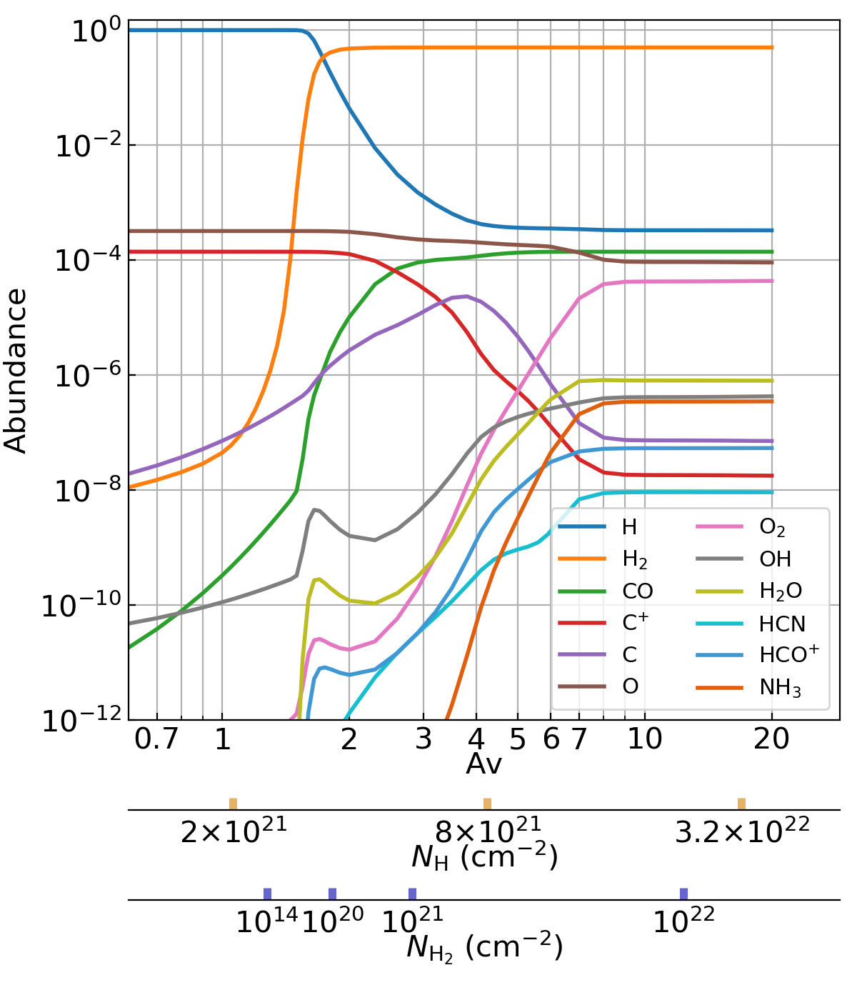

(0.6, 29.0)

In [27]:
fig = plt.figure(figsize=(6,7))
ax = fig.add_axes([0.15,0.28,0.83,0.7])
ax.set_xlabel('Av', labelpad=-2)
ax.set_ylabel('Abundance')
ax.set_xscale('log')
ax.set_yscale('log')
xticks = [0.7, 1,2,3,4,5,6,7,10,20]
ax.set_xticks(xticks)
ax.set_xticklabels(['{:g}'.format(_) for _ in xticks])
ax.set_xlim((0.6, 29))
ax.set_ylim((1e-12, 1.5e0))
ax.grid(axis='both', which='both')
for spe in [b'H', b'H2', b'CO', b'C+', b'C', b'O', b'O2', b'OH', b'H2O', b'HCN', b'HCO+', b'NH3']:
    Av_s, Ncol_H2, X_s = zip(*[(p['phy_params'][b'Av'], p['phy_params'][b'Ncol_H2'],
                                s['ys'][-1][solver.name2idx[spe]])
                      for p,s in zip(p_s,store)])
    ax.plot(Av_s, X_s, lw=2, label=chem2tex(spe.decode()))
ax.legend(fontsize=11, ncol=2)

def forward(x):
    return np.interp(x, Av_s, Ncol_H2)
def inverse(x):
    return np.interp(x, Ncol_H2, Av_s)

botxax = fig.add_axes([0.15,0.19,0.83,0.13], zorder=-1)
botxax.spines['left'].set_visible(False)
botxax.spines['right'].set_visible(False)
botxax.spines['top'].set_visible(False)
botxax.get_yaxis().set_visible(False)
botxax.set_xlabel('$N_{\\rm H}$ (cm$^{-2}$)', labelpad=-5)
botxax.set_xscale('log')
xtickvals = [2e21, 8e21, 3.2e22]
xticks = [N_H_to_Av(_) for _ in xtickvals]
xticklabels = ['$'+sci2tex('{:.1e}'.format(_)).replace('1{\\times} ', '')+'$' for _ in xtickvals]
botxax.set_xticks(xticks)
botxax.set_xticklabels(xticklabels)
botxax.tick_params(axis='x', color=(0.9,0.7,0.4), length=6, width=4, pad=5)
botxax.minorticks_off()
botxax.set_xlim(ax.get_xlim())

botxax = fig.add_axes([0.15,0.1,0.83,0.13], zorder=-2)
botxax.spines['left'].set_visible(False)
botxax.spines['right'].set_visible(False)
botxax.spines['top'].set_visible(False)
botxax.get_yaxis().set_visible(False)
botxax.set_xlabel('$N_{\\rm H_2}$ (cm$^{-2}$)', labelpad=-5)
botxax.set_xscale('log')
xtickvals = [1e14, 1e20, 1e21, 1e22]
xticks = [inverse(_) for _ in xtickvals]
xticklabels = ['$'+sci2tex('{:.1e}'.format(_)).replace('1{\\times} ', '')+'$' for _ in xtickvals]
botxax.set_xticks(xticks)
botxax.set_xticklabels(xticklabels)
botxax.tick_params(axis='x', color=(0.4,0.4,0.8), length=6, width=4, pad=5)
botxax.minorticks_off()
botxax.set_xlim(ax.get_xlim())

In [28]:
plt.savefig('PDR.pdf', bbox_inches='tight')

# Circumstellar envelope

Actually, the implementation is still based on time-dependent physical parameters.  A mapping between space and time is used.

Note that in the code of the UMIST RATE12 paper, all the abundances are expressed relative to H$_2$, or, stated more accurately, to $n_\text{H}/2$, so in several places we have to do a conversion.

The network and code of UMIST RATE12 (UDFA) can be downloaded at:
http://udfa.ajmarkwick.net/index.php?mode=downloads

In [69]:
def GETRAD(AUV):
    """AUV = RADIAL EXTINCTION AT 1000 ANGSTROMS"""
    W = np.zeros(7)
    GA = np.zeros(7)

    W[1] = 0.17132449
    W[2] = 0.36076157
    W[3] = 0.46791393
    W[4] = W[1]
    W[5] = W[2]
    W[6] = W[3]
    GA[1] = 0.93246951
    GA[2] = 0.66120939
    GA[3] = 0.23861919
    GA[4] = -GA[1]
    GA[5] = -GA[2]
    GA[6] = -GA[3]
    
    SUM = 0.0
    for i in range(1,7):
        CETA = (np.pi*GA[i]+np.pi)/2.0
        SUM = SUM + W[i]*(np.sin(CETA)*np.exp((-AUV*CETA)/np.sin(CETA)))
    return np.pi/4.0 * SUM

In [70]:
r_s = np.logspace(np.log10(1e15), np.log10(7.079E+017), num=100)
#n_s = 1.3e7 * (r_s[0]/r_s)**2
T_s = 128.0*(1.0e15/r_s)**4.7 + 447.0*(1.0e15/r_s)**1.05
MSUN = 1.989E33
SEC = 31557600.0
MU = 2.2
MH = 1.6605e-24
MLOSS = 1.5E-5
V = 14.5e5
n_s = (2.0/MU)*(MLOSS*MSUN/SEC)/(4.0*np.pi*(r_s**2)*MU*MH*V) * 2 # n_H
t_s = (r_s-r_s[0]) / V

T_s[T_s < 10] = 10.0
Av_s = 13.81 * r_s[0]/r_s
N_H_s = n_s * r_s
AUV_s = N_H_s * 4.65/1.87e21

RAD_s = GETRAD(AUV_s)

In [71]:
(4.65*2.0)/1.87e21, cs.phy_colDen2AUV_1000A*2

(4.9732620320855616e-21, 4.6e-21)

In [72]:
ab_s = {b'He': 1e-1, b'NH3': 2e-6, b'HF': 8e-9, b'C2H2': 8e-5, b'H2': 1.0, 
        b'N2': 2e-4, b'CO': 6e-4, b'H2S': 4e-9, b'CS': 7e-7, b'SiO': 1.8e-7,
        b'SiS': 1.3e-6, b'CH4': 3.5e-6, b'H2O': 1e-7, b'Mg': 1e-5, b'HCN': 2e-5,
        b'C2H4': 2e-8, b'SiH4': 2.2e-7, b'HCl': 1e-7, b'HCP': 2.5e-8, b'SiC2': 2e-7}
ab_s = {k: ab_s[k]/2 for k in ab_s}

In [73]:
solver = chempl.ChemModel()
solver.load_reactions(b'rate12_noSurf_only_H2_formation.dat')
solver.loadSpeciesEnthalpies(b'Species_enthalpy.dat')
for name in ab_s:
    solver.setAbundanceByName(name, ab_s[name])
solver.set_phy_params_by_dict(phy_params_default)

solver.add_time_dependency(b'T_gas', t_s, T_s)
solver.add_time_dependency(b'T_dust', t_s, T_s)
solver.add_time_dependency(b'Av', t_s, Av_s)
solver.add_time_dependency(b'n_gas', t_s, n_s)
solver.add_time_dependency(b'Ncol_H', t_s, N_H_s)
solver.add_time_dependency(b'G0_UV', t_s, RAD_s)

p_0 = {'nmax': 2000, 'dt0': 1e-1, 't_ratio': 1.08,
       't_max_s': 7e4*cs.phy_SecondsPerYear, 'model_id': 0,
       'phy_params': {b'Ncol_H2': 2e19, b'v_km_s': V/1e5, b'G0_UV': 1.0, b'chi_cosmicray':1e0,
                      b'dust_albedo': 0.5, b'dust_material_density': 3.5, b'dust2gas_mass': 0.5e-2}}

In [74]:
solver.reaction_types

{1: 11, 2: 249, 3: 336, 4: 1, 5: 5577, 61: 2, 62: 2, 63: 1}

In [76]:
reactions = solver.reactions
for i in range(len(reactions)):
    if reactions[i]['reactants'] == [b'CO'] and reactions[i]['itype'] == 3:
        iCO_photo = i
        break

In [78]:
solver.modify_reaction(iCO_photo, {b'itype': [6]})
reactions = solver.reactions
iCO_photo, reactions[iCO_photo]

(5893,
 {'reactants': [b'CO'],
  'products': [b'O', b'C'],
  'abc': [2e-10, 0.0, 3.5],
  'Trange': [10.0, 41000.0],
  'itype': 6,
  'drdy': [nan, nan],
  'rate': 0.0,
  'heat': 6.95311939540847e-310})

In [79]:
solver.reaction_types

{1: 11, 2: 249, 3: 335, 4: 1, 5: 5577, 6: 1, 61: 2, 62: 2, 63: 1}

In [81]:
reactions = solver.reactions
for i in range(len(reactions)):
    if reactions[i]['itype'] == 3:
        abc = reactions[i]['abc']
        abc[2] -= 3.0
        solver.modify_reaction(i, {b'abc': abc})

In [82]:
res0 = run_one_model(p_0, model=solver)

Solver: 0 finished: 21.978294 seconds elapsed


In [83]:
t = np.array(res0['ts'])
Tg_s = [_[b'T_gas'] for _ in res0['phy_s']]
Td_s = [_[b'T_dust'] for _ in res0['phy_s']]
ng_s = [_[b'n_gas'] for _ in res0['phy_s']]
r_t = [chempl.simpleInterpol([_ for _ in t_s], [_ for _ in r_s], _) for _ in t]

In [84]:
import os
data = dict()
with open(os.path.expanduser('~/_o/udfa/rate13_cse_code/csfrac_rate13.out'), 'r') as f:
    ab_mode = False
    for s in f:
        if ab_mode:
            if '**  PHYSICAL PARAMETERS  **' in s:
                ab_mode = False
                continue
            if len(s.strip()) == 0:
                continue
            if 'RADIUS' in s:
                keys = s.split()
                if data.get(keys[-1]) is not None:
                    continue
                for k in keys:
                    data[k] = []
            else:
                vals = [float(_) for _ in s.split()]
                for k,v in zip(keys, vals):
                    data[k].append(v)
        if '** CALCULATED FRACTIONAL ABUNDANCES (/H2) **' in s:
            ab_mode = True

<IPython.core.display.Javascript object>


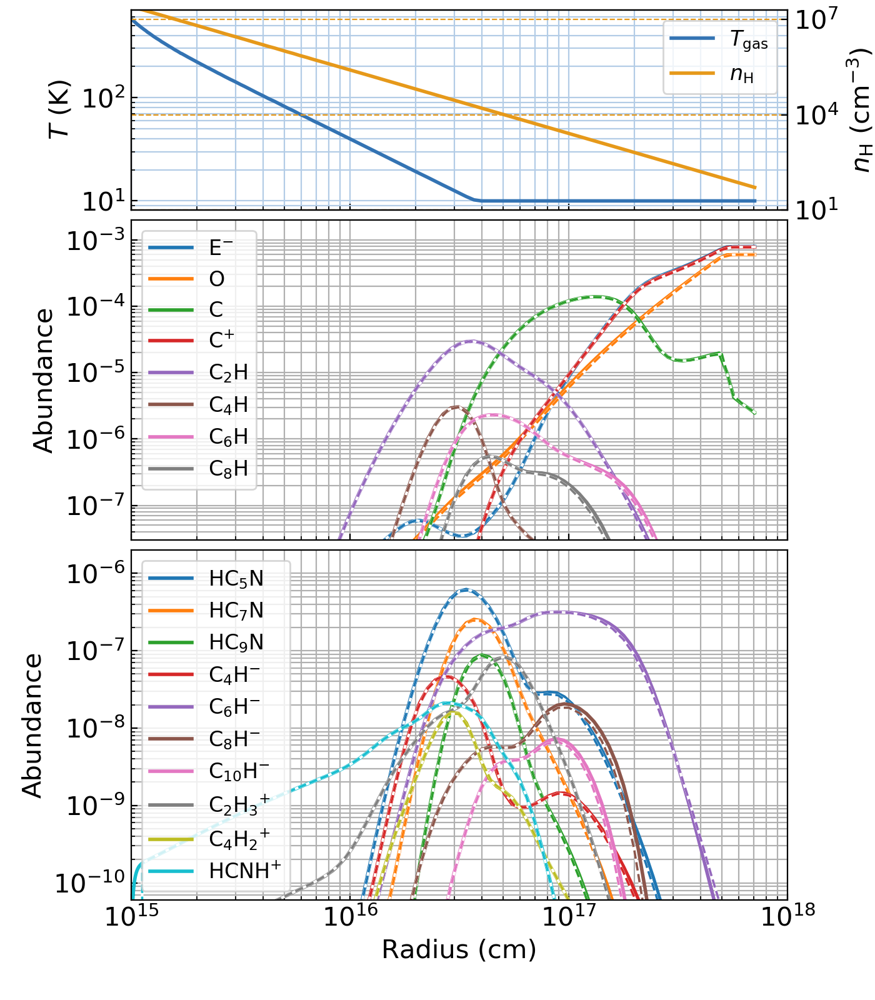

In [85]:
xlim = (1e15,1e18)
fig = plt.figure(figsize=(7,8))
ax = fig.add_axes([0.15,0.79,0.75,0.2])
ax.set_ylabel('$T$ (K)')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim(xlim)
ax.set_xticklabels([])
ax.grid(axis='both', which='both', color=(0.7,0.8,0.9))
ax.plot(r_t, Tg_s, color=(0.2,0.45,0.7), lw=2)
ax = ax.twinx()
ax.set_ylabel('$n_{\\rm H}$ (cm$^{-3}$)')
ax.set_ylim((1e1,2e7))
ax.set_yscale('log')
ax.plot(r_t, ng_s, color=(0.9,0.6,0.1), lw=2)
ax.grid(axis='y', which='both', color=(0.9,0.6,0.1), ls='--')
from matplotlib.lines import Line2D
ax.legend([Line2D([],[],color=(0.2,0.45,0.7), lw=2),
           Line2D([],[],color=(0.9,0.6,0.1), lw=2)],
          ('$T_{\\rm gas}$', '$n_{\\rm H}$'), fontsize=12)

ax = fig.add_axes([0.15,0.46,0.75,0.32])
ax.set_ylabel('Abundance')
ax.set_xscale('log')
ax.set_xticklabels([])
ax.set_yscale('log')
ax.set_xlim(xlim)
ax.set_ylim((3e-8, 2e-3))
ax.grid(axis='both', which='both')
for i,s in enumerate([b'E-', b'O', b'C', b'C+', b'C2H', b'C4H', b'C6H', b'C8H']):
    ax.plot(r_t, [_[solver.name2idx[s]]*2 for _ in res0['ys']],
            label=chem2tex(s.decode()), color=[_['color'] for _ in _colc][i], lw=2)
    s_ = s
    if s_ == b'E-':
        s_ = b'e-'
    ax.plot(data['RADIUS'], data[s_.decode()], color='white', lw=1.5)
    ax.plot(data['RADIUS'], data[s_.decode()], color=[_['color'] for _ in _colc][i], lw=1.3, ls='--')
ax.legend(fontsize=12)

ax = fig.add_axes([0.15,0.1,0.75,0.35])
ax.set_xlabel('Radius (cm)')
ax.set_ylabel('Abundance')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim(xlim)
ax.set_ylim((6e-11, 2e-6))
ax.grid(axis='both', which='both')
for i,s in enumerate([b'HC5N', b'HC7N', b'HC9N', b'C4H-', b'C6H-', b'C8H-', b'C10H-',
                      b'C2H3+', b'C4H2+', b'HCNH+']):
    ax.plot(r_t, [_[solver.name2idx[s]]*2 for _ in res0['ys']],
            label=chem2tex(s.decode()), color=[_['color'] for _ in _colc][i], lw=2)
    s_ = s
    if s_ == b'E-':
        s_ = b'e-'
    ax.plot(data['RADIUS'], data[s_.decode()], color='white', lw=1.5)
    ax.plot(data['RADIUS'], data[s_.decode()], color=[_['color'] for _ in _colc][i], lw=1.3, ls='--')
ax.legend(fontsize=12, loc='upper left')

#plt.savefig('envelope.pdf', bbox_inches='tight')

In [86]:
r_s_csfrac_rate13 = [float(_) for _ in """
1.000E+015 1.122E+015 1.259E+015 1.413E+015 1.585E+015 1.778E+015 1.995E+015
2.239E+015 2.512E+015 2.818E+015 3.162E+015 3.548E+015 3.981E+015 4.467E+015
5.012E+015 5.623E+015 6.310E+015 7.079E+015 7.943E+015 8.913E+015 1.000E+016
1.122E+016 1.259E+016 1.413E+016 1.585E+016 1.778E+016 1.995E+016 2.239E+016
2.512E+016 2.818E+016 3.162E+016 3.548E+016 3.981E+016 4.467E+016 5.012E+016
5.623E+016 6.310E+016 7.079E+016 7.943E+016 8.913E+016 1.000E+017 1.122E+017
1.259E+017 1.413E+017 1.585E+017 1.778E+017 1.995E+017 2.239E+017 2.512E+017
2.818E+017 3.162E+017 3.548E+017 3.981E+017 4.467E+017 5.012E+017 5.623E+017
6.310E+017 7.079E+017""".split()]

In [87]:
species = [b'CO', b'H2', b'E-']

t_yr = t / cs.phy_SecondsPerYear

print(' '.join('{:9s}'.format(_) for _ in ['r'] + [_.decode() for _ in species]))
for r in r_s_csfrac_rate13:
    ab = [r]
    for s in species:
        idx = solver.name2idx[s]
        a_ = chempl.simpleInterpol(r_t, [res0['ys'][i][idx]*2 for i in range(len(res0['ts']))], r)
        ab.append(a_)
    print(' '.join(['{:<9.3e}'.format(_) for _ in ab]))

r         CO        H2        E-       
1.000e+15 6.000e-04 1.000e+00 1.488e-18
1.122e+15 6.000e-04 1.000e+00 1.048e-09
1.259e+15 6.000e-04 1.000e+00 1.552e-09
1.413e+15 6.000e-04 1.000e+00 1.821e-09
1.585e+15 6.000e-04 1.000e+00 2.065e-09
1.778e+15 6.000e-04 1.000e+00 2.329e-09
1.995e+15 6.000e-04 1.000e+00 2.622e-09
2.239e+15 6.000e-04 1.000e+00 2.948e-09
2.512e+15 6.000e-04 1.000e+00 3.309e-09
2.818e+15 6.000e-04 1.000e+00 3.706e-09
3.162e+15 6.000e-04 1.000e+00 4.144e-09
3.548e+15 6.000e-04 1.000e+00 4.625e-09
3.981e+15 6.000e-04 1.000e+00 5.152e-09
4.467e+15 6.000e-04 1.000e+00 5.730e-09
5.012e+15 6.000e-04 1.000e+00 6.362e-09
5.623e+15 6.000e-04 1.000e+00 7.054e-09
6.310e+15 6.000e-04 1.000e+00 7.817e-09
7.079e+15 6.000e-04 1.000e+00 8.672e-09
7.943e+15 6.000e-04 1.000e+00 9.682e-09
8.913e+15 6.000e-04 1.000e+00 1.097e-08
1.000e+16 6.000e-04 1.000e+00 1.288e-08
1.122e+16 6.000e-04 1.000e+00 1.591e-08
1.259e+16 6.000e-04 1.000e+00 2.085e-08
1.413e+16 6.000e-04 1.000e+00 2.851e-08


In [88]:
species = [b'HC5N', b'HC7N', b'HC9N', b'C4H-', b'C6H-', b'C8H-', b'C10H-', b'C2H3+', b'C4H2+', b'HCNH+']

t_yr = t / cs.phy_SecondsPerYear

print(' '.join('{:9s}'.format(_) for _ in ['r'] + [_.decode() for _ in species]))
for r in r_s_csfrac_rate13:
    ab = [r]
    for s in species:
        idx = solver.name2idx[s]
        a_ = chempl.simpleInterpol(r_t, [res0['ys'][i][idx]*2 for i in range(len(res0['ts']))], r)
        ab.append(a_)
    print(' '.join(['{:<9.2e}'.format(_) for _ in ab]))

r         HC5N      HC7N      HC9N      C4H-      C6H-      C8H-      C10H-     C2H3+     C4H2+     HCNH+    
1.00e+15  1.55e-50  2.41e-69  7.48e-92  5.83e-58  4.57e-72  9.36e-90  1.49e-123 9.09e-25  3.45e-27  3.86e-28 
1.12e+15  1.74e-17  5.20e-19  9.19e-24  2.02e-15  1.25e-15  4.50e-20  1.13e-25  7.69e-12  7.04e-15  1.79e-10 
1.26e+15  1.92e-16  1.43e-17  7.19e-22  1.25e-14  1.70e-14  3.25e-18  1.94e-23  9.05e-12  8.78e-15  2.14e-10 
1.41e+15  6.01e-16  1.03e-16  5.84e-21  3.00e-14  5.74e-14  2.81e-17  2.56e-22  1.07e-11  1.10e-14  2.52e-10 
1.58e+15  1.27e-15  4.20e-16  2.16e-20  5.34e-14  1.22e-13  1.10e-16  1.32e-21  1.27e-11  1.38e-14  2.98e-10 
1.78e+15  2.28e-15  1.24e-15  5.67e-20  8.41e-14  2.13e-13  3.04e-16  4.53e-21  1.50e-11  1.71e-14  3.52e-10 
2.00e+15  3.77e-15  2.90e-15  1.22e-19  1.25e-13  3.32e-13  6.78e-16  1.20e-20  1.78e-11  2.14e-14  4.16e-10 
2.24e+15  5.96e-15  5.73e-15  2.33e-19  1.78e-13  4.80e-13  1.32e-15  2.72e-20  2.11e-11  2.66e-14  4.91e-10 
2.51e+15  

In [89]:
CO_photo_rates = [
    solver.calculate_a_rate(res0['ts'][i], res0['ys'][i],
                            iCO_photo, updatePhyParams=True) / res0['ys'][i][solver.name2idx[b'CO']]
    for i in range(len(res0['ts']))]
CO_photo_rates_t = [chempl.simpleInterpol(res0['ts'], CO_photo_rates, _) for _ in t_s]

In [90]:
print("""RADIUS n(H2) TEMP. A_V RAD.FIELD  CO_K(PHOT)""".split())
for _ in [' '.join(['{:9.3e}'.format(_) for _ in _]) for _ in
 zip(r_s_csfrac_rate13,
     [chempl.simpleInterpol(r_s, n_s, r) for r in r_s_csfrac_rate13],
     [chempl.simpleInterpol(r_s, T_s, r) for r in r_s_csfrac_rate13],
     [chempl.simpleInterpol(r_s, Av_s, r) for r in r_s_csfrac_rate13],
     [chempl.simpleInterpol(r_s, RAD_s, r) for r in r_s_csfrac_rate13],
     [chempl.simpleInterpol(r_s, CO_photo_rates_t, r) for r in r_s_csfrac_rate13])]:
    print(_)

['RADIUS', 'n(H2)', 'TEMP.', 'A_V', 'RAD.FIELD', 'CO_K(PHOT)']
1.000e+15 2.582e+07 5.750e+02 1.381e+01 2.445e-30 1.912e-38
1.122e+15 2.057e+07 4.719e+02 1.232e+01 6.091e-27 6.196e-36
1.259e+15 1.635e+07 3.954e+02 1.098e+01 5.081e-24 9.648e-34
1.413e+15 1.296e+07 3.366e+02 9.781e+00 1.393e-21 7.233e-32
1.585e+15 1.029e+07 2.904e+02 8.715e+00 9.216e-20 2.264e-30
1.778e+15 8.193e+06 2.532e+02 7.775e+00 1.198e-17 1.054e-28
1.995e+15 6.509e+06 2.218e+02 6.930e+00 7.627e-16 2.867e-27
2.239e+15 5.160e+06 1.948e+02 6.171e+00 2.395e-14 5.471e-26
2.512e+15 4.098e+06 1.717e+02 5.500e+00 4.763e-13 6.440e-25
2.818e+15 3.262e+06 1.518e+02 4.906e+00 9.695e-12 9.425e-24
3.162e+15 2.591e+06 1.342e+02 4.372e+00 1.278e-10 8.206e-23
3.548e+15 2.054e+06 1.186e+02 3.894e+00 1.131e-09 5.805e-22
3.981e+15 1.632e+06 1.051e+02 3.471e+00 8.666e-09 3.747e-21
4.467e+15 1.298e+06 9.307e+01 3.095e+00 5.730e-08 2.120e-20
5.012e+15 1.031e+06 8.243e+01 2.758e+00 2.946e-07 9.753e-20
5.623e+15 8.172e+05 7.297e+01 2.456e+

In [91]:
printFormationDestruction(b'HC5N', solver, res0, tmin=1e4, tmax=1.2e4, nstep=1)

Time      total_f   total_d   tscale_n  tscale_f tscale_d Tg    Td    ngas     y        tidx
1.063e+04 3.371e-23 3.443e-23 -7.50e+02 1.60e+01 1.57e+01 10.00 10.00 1.09e+02 1.70e-14 341 
3.356e-23 H + C5N-  ->  HC5N + E- [5.8e-10, 0.0, 0.0] 95
-2.108e-23 C+ + HC5N  ->  C5H+ + CN [6e-09, -0.5, 0.0] 1623
-6.673e-24 HC5N  ->  C5N + H [5e-10, 0.0, -1.2] 5929
-6.673e-24 HC5N  ->  C4H + CN [5e-10, 0.0, -1.2] 5928
Time      total_f   total_d   tscale_n  tscale_f tscale_d Tg    Td    ngas     y        tidx
1.149e+04 1.088e-23 1.110e-23 -8.11e+02 1.63e+01 1.60e+01 10.00 10.00 9.35e+01 5.61e-15 342 
1.083e-23 H + C5N-  ->  HC5N + E- [5.8e-10, 0.0, 0.0] 95
-6.623e-24 C+ + HC5N  ->  C5H+ + CN [6e-09, -0.5, 0.0] 1623
-2.239e-24 HC5N  ->  C5N + H [5e-10, 0.0, -1.2] 5929
-2.239e-24 HC5N  ->  C4H + CN [5e-10, 0.0, -1.2] 5928


# Use multiprocessing for parallelization

In [3]:
phy_params_default

{b'Av': 20.0,
 b'G0_UV': 1.0,
 b'Ncol_H2': 4e+22,
 b'T_dust': 15.0,
 b'T_gas': 15.0,
 b'chemdesorption_factor': 0.05,
 b'chi_Xray': 0.0,
 b'chi_cosmicray': 1.0,
 b'dust2gas_mass': 0.01,
 b'dust_albedo': 0.6,
 b'dust_material_density': 2.0,
 b'dust_radius': 1e-05,
 b'dust_site_density': 1000000000000000.0,
 b'dv_km_s': 1.0,
 b'v_km_s': 14.5,
 b'mean_mol_weight': 1.4,
 b'n_gas': 50000.0,
 b't_max_year': 10000000.0}

In [9]:
model0 = chempl.ChemModel(fReactions=b'rate12_noSurf_only_H2_formation.dat',
                          fSpeciesEnthalpies=b'Species_enthalpy.dat',
                          fInitialAbundances=b'initial_abundances.dat')
model0.set_phy_params_by_dict(phy_params_default)
model0.prepare()

nParams = 8
p_s = [{'model_id': i,
        'phy_params': {b'T_gas': 10.0+2.0*i, b'T_dust': 10.0+2.0*i,
                       b'n_gas': 1e5/(1+i)**2}}
       for i in range(nParams)]

nMax = 2000
tMax = 1e7 * cs.phy_SecondsPerYear
t_ratio = 1.08

def run_one(p):
    t = 0.0
    dt = 1.0
    y = [_ for _ in model0.abundances]
    store = {'ts': [], 'ys': []}
    model0.set_solver(model_id=p['model_id'])
    model0.set_phy_params_by_dict(p['phy_params'])
    for i in range(nMax):
        t, y = model0.update(y, t=t, dt=dt)
        store['ts'].append(t)
        store['ys'].append(y)
        if t >= tMax:
            break
        dt = dt * t_ratio
        if t+dt > tMax:
            dt = tMax - t
    return store

pool = Pool(processes=nParams)

In [10]:
%%time

# Sequential mode
store_s_0 = [run_one(p) for p in p_s]

CPU times: user 31.6 s, sys: 258 ms, total: 31.9 s
Wall time: 31.9 s


In [11]:
%%time

# Use multiprocessing
store_s_1 = pool.map(run_one, p_s)

CPU times: user 118 ms, sys: 89.2 ms, total: 207 ms
Wall time: 9.74 s


In [12]:
# Test whether the two results are identical
[np.any(np.array(s0['ys'])-np.array(s1['ys'])) for s0,s1 in zip(store_s_0,store_s_1)]

[False, False, False, False, False, False, False, False]

<IPython.core.display.Javascript object>


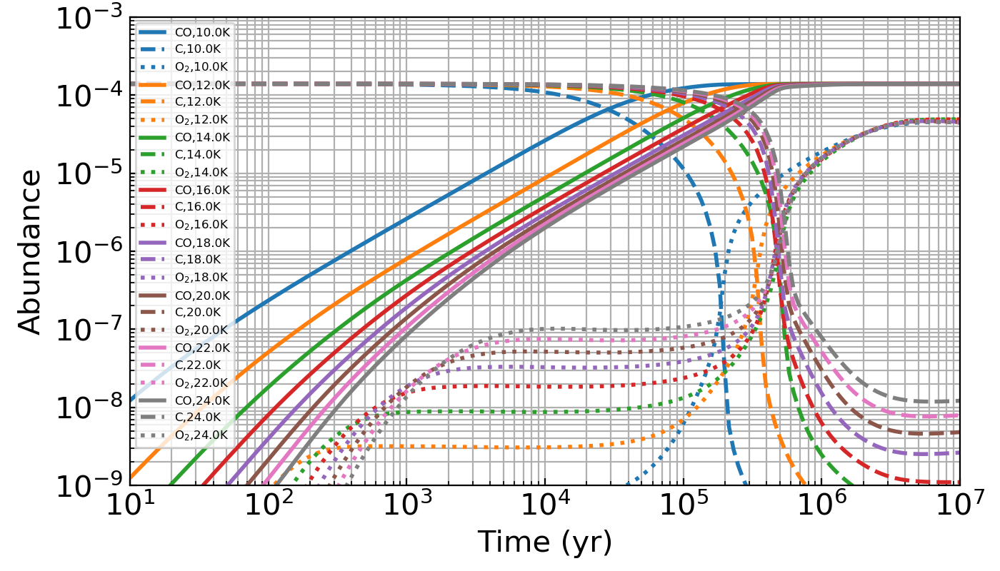

In [13]:
fig = plt.figure(figsize=(7,4))
ax = fig.add_axes([0.13,0.15,0.83,0.82])
ax.set_xlabel('Time (yr)')
ax.set_ylabel('Abundance')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim((1e1, 1e7))
ax.set_ylim((1e-9, 1e-3))
ax.grid(axis='both', which='both')

for s0,p,col in zip(store_s_0, p_s, _colc):
    for name,ls in zip([b'CO', b'C', b'O2'], ['-', '--', ':']):
        ax.plot(np.array(s0['ts'])/cs.phy_SecondsPerYear,
                [_[model0.name2idx[name]] for _ in s0['ys']],
                label=chem2tex(name.decode()) + ',{:}K'.format(p['phy_params'][b'T_gas']),
                lw=2, color=col['color'], ls=ls)
ax.legend(fontsize=6, loc='upper left')